In [1]:
# %matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
if "../" not in sys.path:
  sys.path.append("../")
from lib.envs.slicing_env import SlicingEnvironment
from lib.agents.tforce import TensorforceAgent
from tensorforce import Environment, Agent
from lib import utils
from scipy.stats import poisson
matplotlib.style.use('ggplot')

In [2]:
# Configuring the simulation
np.random.seed(2021)

# Number of DRL agent timesteps per episode 
max_episode_timesteps = 2

total_data_episodes = 1

# Number of DRL agent episodes (we are doing episodes just for the sake of better results visulization)

total_episodes = 14000 


# number of users per slice in the following order: VoLTE, Video, URLLC
num_users = [int(46/4), int(46/4), int(8/4)]

poisson_volte = np.full((1, 200), 1)
poisson_video = np.full((1, 200), 1)
poisson_urllc = np.full((1, 200), 1)

max_num_users = [max(poisson_volte[0]), max(poisson_video[0]), max(poisson_urllc[0])]

num_users_poisson = [poisson_video[0], poisson_volte[0], poisson_urllc[0]]


agent_name = 'ppo'
learning_type = 'non_accelerated'

max_traffic_percentage = 1
num_action_lvls = 15
num_slices = 3
sl_win_size = 40
time_quantum = 1

max_size_per_tti = 40
max_num_packets = 0


max_trans_per_tti = 6

c1_volte = 0.5
c2_volte = 10
c1_urllc = 2
c2_urllc = 3
c1_video = 1
c2_video = 7

num_traffic_var = 2

discount_factor=0.5
epsilon=0.9
epsilon_decay=0.99
decay_steps=11000
loaded_qtable='no'
batch_size = 8
memory = 20000
device='CPU'

random_seed = 2021 
learning_rate = 0.01
final_value = 0.01
epsilon_every_x_steps = 50
max_epsilon_steps = 12000
reward_function_type = 'shaping'
traffic_pattern = 4

In [3]:
traffic_df = utils.generate_data(max_num_users[0], max_num_users[1], max_num_users[2],
                                   sl_win_size*max_episode_timesteps, traffic_pattern)
traffic_df = traffic_df.reset_index(drop=True)

In [4]:
traffic_df[traffic_df['type'] == 'volte'].head()

,type,user,arrival_times,packet_sizes
0,volte,1,0,6
1,volte,2,0,6
10,volte,1,7,10
11,volte,2,7,10
16,volte,1,8,6


In [5]:
# for i in range(0, 1):
w_volte = 0.1
w_urllc = 0.7
w_video = 0.2

enviro = SlicingEnvironment(traffic_df, max_num_packets, max_size_per_tti, num_action_lvls, 
                     num_slices, max_episode_timesteps, sl_win_size, time_quantum,total_data_episodes,
                     num_users_poisson, max_traffic_percentage, max_trans_per_tti, w_volte, w_urllc,
                        w_video, c1_volte, c1_urllc, c1_video, c2_volte, c2_urllc, c2_video, num_traffic_var,
                           reward_function_type)

environment = Environment.create(
        environment=enviro, max_episode_timesteps=max_episode_timesteps
    )


slicing_agent = TensorforceAgent(agent_name, environment, batch_size , memory, epsilon, epsilon_decay,
                                loaded_qtable, decay_steps, device, learning_rate, final_value,
                                random_seed, discount_factor)

# choose algorithm and create tensorforce agent
ep_rewards = {}
step = 0

In [6]:
slicing_agent.agent.config.seed

2021

In [7]:

for episode in range(total_episodes):
    if (episode >= decay_steps ):
        epsilon = final_value
    if (episode >= max_epsilon_steps ):
        epsilon = 0
    # Record episode experience
    episode_states = list()
    episode_internals = list()
    episode_actions = list()
    episode_terminal = list()
    episode_reward = list()
    states = environment.reset()

    # Episode using independent-act and agent.intial_internals()
    internals = slicing_agent.agent.initial_internals()
    terminal = False
    sum_rewards = 0.0
    
    while not terminal:
        print('Episode: ' + str(episode) + ', Step: ' + str(step))
        print("---current observation: ", states)
        print("---agent algorithm: ", slicing_agent.agent_algorithm)
        episode_states.append(states)
        episode_internals.append(internals)
        actions, internals = slicing_agent.agent.act(states=states, internals=internals, independent=True,\
                                                    deterministic=True)

        # epsilon greedy
        print('epsilon is: ', epsilon)
        p = np.random.random()
        if p < epsilon:
            actions = np.random.choice(num_action_lvls)

        if ( (0 < episode < decay_steps) and (episode%epsilon_every_x_steps==0) and (epsilon>final_value)):
            epsilon = epsilon * epsilon_decay

        print("---agent action: ", actions)
        episode_actions.append(actions)
        states, terminal, reward = environment.execute(actions=actions)
        print("---reward, done: ", reward, terminal)
        episode_terminal.append(terminal)
        episode_reward.append(reward)
        sum_rewards += reward
        print ('cumulative episode reward: ', sum_rewards)
        step += 1

    print('Episode {}: {}'.format(episode, sum_rewards))
    ep_rewards[episode] = sum_rewards
    print("End episode: ", episode)
    print ('episode total reward: ', ep_rewards[episode])

    # Feed recorded experience to agent
    slicing_agent.agent.experience(
        states=episode_states, internals=episode_internals, actions=episode_actions,
        terminal=episode_terminal, reward=episode_reward
    )

    # Perform update
    slicing_agent.agent.update()

self.volte_demand is:  0
self.urllc_demand is:  0
self.video_demand is:  0
total_demand is:  0
Episode: 0, Step: 0
---current observation:  [[0], [0], [0]]
---agent algorithm:  ppo
epsilon is:  0.9
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 0: 0.5730960938492622
End episode:  0
episode total reward:  0.5730960938492622
self.volte_demand is:  

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 9: 0.213145017079868
End episode:  9
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10, Step: 10
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.9
---agent action:  0
self.total_avg_waiting_time_vide

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 18: 0.5730960938492622
End episode:  18
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 19, Step: 19
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.9
---agent action:  

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 27: 0.29850675992327536
End episode:  27
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 28, Step: 28
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.9
---agent action:  0
self.total_avg_waiting_time_v

epsilon is:  0.9
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 36: 3.7162130410249916
End episode:  36
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 37, Step: 37
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 53, Step: 53
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.891
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 53: 0.09953090756826104
End episode:  53
episode total reward:  0.09953090756826104
self.volte_demand

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 70, Step: 70
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.891
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 70: 3.7162130410249916
End episode:  70
episode total reward:  3.7162130410249916
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 87, Step: 87
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.891
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 87: 0.09953090756826104
End episode:  87
episode total reward:  0.09953090756826104
self.volte_demand

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 104, Step: 104
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.88209
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 104: 0.28148194337631793
End episode:  104
episode total reward:  0.2

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 112: 0.28148194337631793
End episode:  112
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 113, Step: 113
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.88209
---a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 121, Step: 121
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.88209
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 121: 0.29850675992327536
End episode:  121
episode total reward:  0.29850675992327536
self.volte_demand is:

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 129: 0.29439948083279843
End episode:  129
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 130, Step: 130
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.88209
---agent action:  2
self.tota

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 138: 3.7162130410249916
End episode:  138
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 139, Step: 139
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.88209
---agent action:  5
self.to

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 147, Step: 147
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.88209
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 147: 0.09953090756826104
End episode:  147
episode total reward:  0.09953090756826104
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 164, Step: 164
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8732691
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 164: 0.10025903064344324
End episode:  164
episode total reward: 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 172: 3.7162130410249916
End episode:  172
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 173, Step: 173
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8732691
---agent action:  12
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 189, Step: 189
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8732691
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 189: 0.29439948083279843
End episode:  189
episode total reward:  0.29439948083279843
self.vo

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 197: 0.28775767323448875
End episode:  197
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 198, Step: 198
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8732691
---agent action:  9
self.to

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 214, Step: 214
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8645364090000001
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 214: 0.28148194337631793
End episode:  214
episode total r

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 222: 3.8394694066596013
End episode:  222
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 223, Step: 223
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8645364090000001
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 239, Step: 239
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8645364090000001
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 239: 0.09951366073016793
End episode:  239
episode total reward:  0.09951366

epsilon is:  0.8645364090000001
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 247: 0.2880632300535844
End episode:  247
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 248, Step: 248
---current observation:  [[0.177], [0.646], [0.177]]
---agent algor

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 264, Step: 264
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.85589104491
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 264: 0.2819484446886869
End episode:  264
episode total reward:  0.281948444688

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 280, Step: 280
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.85589104491
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 280: 0.28148194337631793
End episode:  280
episode total reward

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 288: 3.8394694066596013
End episode:  288
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 289, Step: 289
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.85589104491
---agent action:  10
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 297, Step: 297
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.85589104491
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 297: 0.09953090756826104
End episode:  297
episode total reward:  0.09953090756826104
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 305: 0.09989391054782705
End episode:  305
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 306, Step: 306
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8473321344609
---agent action:  14
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 314, Step: 314
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8473321344609
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 314: 3.7162130410249916
End episode:  314
episode total reward:  3.716213041024991

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 322: 0.28148194337631793
End episode:  322
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 323, Step: 323
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8473321344

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 331, Step: 331
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8473321344609
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 331: 3.646342419074309
End episode:  331
episode total reward:  3.646342419074309
self.volte_d

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 339: 3.646342419074309
End episode:  339
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 340, Step: 340
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8473321344609
---agent action:  5
self.total_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 348, Step: 348
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8473321344609
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 348: 0.5730960938492622
End episode:  348
episode total reward:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 356: 3.885261972947191
End episode:  356
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 357, Step: 357
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8388588131162911
---agent action:  6
self.to

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 365, Step: 365
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8388588131162911
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 365: 0.09989391054782705
End episode:  365
episode total reward:  0.09989391054782705
se

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 380: 0.5155502157723777
End episode:  380
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 381, Step: 381
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8388588131162911
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 396: 0.2819484446886869
End episode:  396
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 397, Step: 397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8388588131162911
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 405, Step: 405
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8304702249851281
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 405: 0.29872732341501246
End episode:  405
episode total reward:  0.29872732341501246
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 421, Step: 421
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8304702249851281
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 421: 0.2833221052712958
End episode:  421
episode total reward:  0.2833221052712958
s

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 429: 0.28775767323448875
End episode:  429
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 430, Step: 430
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8304702249851281
---agent action:  

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 445: 0.28775767323448875
End episode:  445
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 446, Step: 446
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8304702249851281
---agent action:  

waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 460: 0.2819484446886869
End episode:  460
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 461, Step: 461
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8221655227352769
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 476: 0.1002758574280506
End episode:  476
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 477, Step: 477
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8221655227352769
---agent action:  1

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 492: 0.28148194337631793
End episode:  492
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 493, Step: 493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8221655227

epsilon is:  0.8139438675079241
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 508: 0.5155502157723777
End episode:  508
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 509, Step: 509
---current observation:  [[0.276], [0.447], [0.276]]
---age

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 525, Step: 525
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8139438675079241
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 525: 3.646342419074309
End episode:  525
episode total reward:  3.646342419074309
self.volt

epsilon is:  0.8139438675079241
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 533: 3.646342419074309
End episode:  533
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 534, Step: 534
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 547: 0.09989391054782705
End episode:  547
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 548, Step: 548
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.8139438675079241
---agent action:  8
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 562: 0.2819484446886869
End episode:  562
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 563, Step: 563
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8058044288328449
---agent act

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 578: 3.8394694066596013
End episode:  578
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 579, Step: 579
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8058044288328449
---agent action: 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 594: 0.1002758574280506
End episode:  594
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 595, Step: 595
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.8058044288328449
---agent action:  1

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 609: 0.09953090756826104
End episode:  609
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 610, Step: 610
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7977463845445164
---agent action:  2

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 623: 3.646342419074309
End episode:  623
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 624, Step: 624
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7977463845445164
---agent action:  8
self.tot

epsilon is:  0.7977463845445164
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 638: 3.715472773269245
End episode:  638
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 639, Step: 639
---current observation:  [[0.276], [0.447], [0.2

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 653, Step: 653
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7897689206990712
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 653: 0.2833221052712958
End episode:  653
episode total reward:  0.2833221052712958
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 668, Step: 668
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7897689206990712
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 668: 0.28148194337631793
End episode:  668
episode total r

epsilon is:  0.7897689206990712
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 683: 0.28775767323448875
End episode:  683
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 684, Step: 684
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  pp

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 699, Step: 699
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7897689206990712
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 699: 0.09953090756826104
End episode:  699
episode total reward:  0.09953090756826104


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 714, Step: 714
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7818712314920805
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 714: 3.885261972947191
End episode:  714
episode total reward:  3.885261972947191
self.v

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 729: 0.213145017079868
End episode:  729
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 730, Step: 730
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7818712314920805
---agent action:  1
self.total_

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 744: 0.10025903064344324
End episode:  744
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 745, Step: 745
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.78187123

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 760, Step: 760
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7740525191771597
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 760: 3.885261972947191
End episode:  760
episode total reward:  3.885261972947191
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 775: 3.646342419074309
End episode:  775
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 776, Step: 776
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7740525191771597
---agent action:  5
self.tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 791, Step: 791
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7740525191771597
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 791: 0.2126251050041843
End episode:  791
episode total reward:  0.2126251050041843
self.volte

epsilon is:  0.7663119939853881
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 806: 3.8394694066596013
End episode:  806
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 807, Step: 807
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  p

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 821, Step: 821
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7663119939853881
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 821: 0.2126251050041843
End episode:  821
episode total reward:  0.2126251050041843
self.volte

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 836, Step: 836
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7663119939853881
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 836: 0.29856606321842644
End episode:  836
epis

epsilon is:  0.7586488740455342
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 851: 3.646342419074309
End episode:  851
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 852, Step: 852
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon 

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 866: 0.5155502157723777
End episode:  866
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 867, Step: 867
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7586488740455342
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 882: 0.2819484446886869
End episode:  882
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 883, Step: 883
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7586488740455342
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 898, Step: 898
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7586488740455342
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 898: 0.10025903064344324
End episode:  898
episode total

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 913: 3.646342419074309
End episode:  913
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 914, Step: 914
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7510623853050789
---agent action:  14
self.to

total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 928: 0.5849947929509206
End episode:  928
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 929, Step: 929
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7510623853050789
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand

waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 942: 3.7162130410249916
End episode:  942
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 943, Step: 943
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7510623853050789
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
wai

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 956: 0.2981835210158512
End episode:  956
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 957, Step: 957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7435517614520281
---agent action:  4
self.total_avg_waiting

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 971: 0.09953090756826104
End episode:  971
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 972, Step: 972
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7435517614520281
---agent action:  8

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 985: 3.646342419074309
End episode:  985
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 986, Step: 986
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7435517614520281
---agent action:  5
self.tot

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1000, Step: 1000
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7435517614520281
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1000: 3.7162130410249916
End episode:  1000
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 1014: 3.77390430641424
End episode:  1014
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1015, Step: 1015
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7361162438375077
---agent action:  12
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1029, Step: 1029
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7361162438375077
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 1029: 0.2126251050041843
End episode:  1029
episode total reward:  0.2126251050041843
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1043: 0.09953090756826104
End episode:  1043
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1044, Step: 1044
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7361162438375077
---agent action

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 1057: 0.29850675992327536
End episode:  1057
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1058, Step: 1058
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7287550813991327
---agent action:  7
self.t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1072, Step: 1072
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7287550813991327
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 1072: 0.5849947929509206
End episode:  1072
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1086, Step: 1086
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7287550813991327
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 1086: 0.10024179144390966
End episode:  108

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 1100: 3.885261972947191
End episode:  1100
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1101, Step: 1101
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7214675305851413
---agent action:  2
sel

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 1115: 0.29850675992327536
End episode:  1115
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1116, Step: 1116
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7214675305851413
---agent action:  11
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1129, Step: 1129
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7214675305851413
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 1129: 0.28802562743055654
End episode:  1129
episode total reward:  0.28802562743

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1142, Step: 1142
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7214675305851413
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 1142: 3.77390430641424
End episode:  1142
episode total reward:  3.77390430641424
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1155: 3.646342419074309
End episode:  1155
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1156, Step: 1156
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7142528552792899
---agent action:  4
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1169, Step: 1169
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7142528552792899
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1169: 0.09953090756826104
End episode:  1169
episode total reward:  0.09953090756826

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 1182: 0.2981835210158512
End episode:  1182
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1183, Step: 1183
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.7142528552792899
---agent action:  4
self.total_avg_wai

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 1195: 0.213145017079868
End episode:  1195
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1196, Step: 1196
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.7142528552792899
---agent action:  8
self.to

epsilon is:  0.707110326726497
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1208: 3.7162130410249916
End episode:  1208
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1209, Step: 1209
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1222, Step: 1222
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.707110326726497
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1222: 3.7162130410249916
End episode:  1222
episode total reward:  3.716213041

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1235, Step: 1235
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.707110326726497
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1235: 3.646342419074309
End episode:  1235
episode total reward:  3.646342419074309
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1247: 0.09989391054782705
End episode:  1247
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1248, Step: 1248
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.707110326726497
---agent action:  

epsilon is:  0.700039223459232
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 1261: 0.29439948083279843
End episode:  1261
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1262, Step: 1262
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 1273: 0.28802562743055654
End episode:  1273
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1274, Step: 1274
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.700039223459232
---agent actio

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1287: 0.09989391054782705
End episode:  1287
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1288, Step: 1288
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.700039223459232
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1301, Step: 1301
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6930388312246396
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1301: 3.646342419074309
End episode:  1301
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1315, Step: 1315
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6930388312246396
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1315: 0.09953090756826104
End episode:  1315
episode total reward:  0.09953090756826

epsilon is:  0.6930388312246396
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1328: 3.7162130410249916
End episode:  1328
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1329, Step: 1329
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorith

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1341: 3.646342419074309
End episode:  1341
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1342, Step: 1342
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6930388312246396
---agent action:  8
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1355, Step: 1355
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6861084429123933
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1355: 3.646342419074309
End episode:  1355
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1368, Step: 1368
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6861084429123933
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 1368: 0.28148194337631793
End episode:  1368
episode tot

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1382, Step: 1382
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6861084429123933
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 1382: 0.5730960938492622
End episode:  1382
episode total re

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1395: 3.646342419074309
End episode:  1395
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1396, Step: 1396
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6861084429123933
---agent action:  8
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1408: 3.7162130410249916
End episode:  1408
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1409, Step: 1409
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6792473584832693
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1421, Step: 1421
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6792473584832693
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1421: 0.09989391054782705
End episode:  1421
episode total reward:  0.0998939105478270

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1433: 3.646342419074309
End episode:  1433
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1434, Step: 1434
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6792473584832693
---agent action:  14
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1445: 3.646342419074309
End episode:  1445
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1446, Step: 1446
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6792473584832693
---agent action:  2
self

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 1457: 0.29850675992327536
End episode:  1457
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1458, Step: 1458
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6724548848984366
---agent action:  4
self.t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1470, Step: 1470
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6724548848984366
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1470: 3.7162130410249916
End episode:  1470
episode total reward:  3.71621304

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1482, Step: 1482
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6724548848984366
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 1482: 3.8394694066596013
End episode:  1482
episode total reward:  3.839469406

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1495, Step: 1495
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6724548848984366
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 1495: 0.2833221052712958
End episode:  1495
episode total reward:  0.28332210527129

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 1507: 0.29872732341501246
End episode:  1507
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1508, Step: 1508
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6657303360494523
---agent action:  6
self.tota

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 1519: 0.29850675992327536
End episode:  1519
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1520, Step: 1520
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6657303360494523
---agent action:  10
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 1532: 3.77390430641424
End episode:  1532
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1533, Step: 1533
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6657303360494523
---agent action:  4
self.t

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 1545: 0.29872732341501246
End episode:  1545
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1546, Step: 1546
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6657303360494523
---agent action:  8
self.tota

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1557, Step: 1557
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6590730326889578
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1557: 0.09989391054782705
End episode:  1557
episode total reward:  0.0998939105478270

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1567, Step: 1567
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6590730326889578
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1567: 0.2880632300535844
End episode:  1567
episode total reward:  0.288

epsilon is:  0.6590730326889578
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1579: 3.646342419074309
End episode:  1579
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1580, Step: 1580
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

epsilon is:  0.6590730326889578
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1591: 0.09953090756826104
End episode:  1591
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1592, Step: 1592
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm: 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 1602: 3.77390430641424
End episode:  1602
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1603, Step: 1603
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6524823023620682
---agent action:  0
self.t

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 1613: 0.28775767323448875
End episode:  1613
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1614, Step: 1614
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6524823023620682
---agent actio

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 1626: 3.8394694066596013
End episode:  1626
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1627, Step: 1627
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6524823023620682
---agent acti

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1639, Step: 1639
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6524823023620682
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1639: 3.646342419074309
End episode:  1639
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 1651: 0.2126251050041843
End episode:  1651
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1652, Step: 1652
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6459574793384475
---agent action:  6
self.t

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1665, Step: 1665
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6459574793384475
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1665: 3.646342419074309
End episode:  1665
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 1677: 0.213145017079868
End episode:  1677
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1678, Step: 1678
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6459574793384475
---agent action:  4
self.to

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1687: 3.646342419074309
End episode:  1687
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1688, Step: 1688
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6459574793384475
---agent action:  14
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1699, Step: 1699
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6459574793384475
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1699: 0.09953090756826104
End episode:  1699
episode total reward:  0.09953090756826

episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1711, Step: 1711
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6394979045450631
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1711: 0.09989391054782705
End episode:  1711


self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 1721: 0.29439948083279843
End episode:  1721
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1722, Step: 1722
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6394979045450631
---agent actio

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1731, Step: 1731
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6394979045450631
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 1731: 0.28775767323448875
End episode:  1731
episode total reward:  0.2877576732344

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1741: 3.646342419074309
End episode:  1741
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1742, Step: 1742
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6394979045450631
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1754, Step: 1754
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6331029254996124
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 1754: 0.2819484446886869
End episode:  1754
episode total reward:  0.281

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1765, Step: 1765
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6331029254996124
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 1765: 0.09951366073016793
End episode:  1765
episode total reward:  0.0995

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1775, Step: 1775
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6331029254996124
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1775: 0.2880632300535844
End episode:  1775
episode total reward:  0.288

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1787: 3.646342419074309
End episode:  1787
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1788, Step: 1788
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6331029254996124
---agent action:  0
self

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1799: 0.38993140420502714
End episode:  1799
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1800, Step: 1800
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6331029254996124
---agent actio

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1810, Step: 1810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6267718962446163
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 1810: 3.7162130410249916
End episode:  1810
episode total reward:  3.71621304

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1821, Step: 1821
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6267718962446163
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 1821: 0.213145017079868
End episode:  1821
episode total reward:  0.213145017079868
self.vol

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1831: 3.646342419074309
End episode:  1831
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1832, Step: 1832
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6267718962446163
---agent action:  3
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1841: 0.09953090756826104
End episode:  1841
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1842, Step: 1842
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6267718962446163
---agent action

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1851: 0.09989391054782705
End episode:  1851
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1852, Step: 1852
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6205041772821701
---agent action: 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1862, Step: 1862
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6205041772821701
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 1862: 0.5849947929509206
End episode:  1862
episode total r

epsilon is:  0.6205041772821701
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1873: 3.646342419074309
End episode:  1873
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1874, Step: 1874
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

epsilon is:  0.6205041772821701
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 1885: 0.2126251050041843
End episode:  1885
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1886, Step: 1886
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsil

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1895: 3.646342419074309
End episode:  1895
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1896, Step: 1896
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6205041772821701
---agent action:  2
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1907, Step: 1907
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6142991355093484
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1907: 3.646342419074309
End episode:  1907
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 1916: 0.2981835210158512
End episode:  1916
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1917, Step: 1917
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6142991355093484
---agent action:  7
self.total_avg_wai

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1927, Step: 1927
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6142991355093484
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1927: 0.38993140420502714
End episode:  1927
episode total reward:  0.3899314042050

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 1938: 3.715472773269245
End episode:  1938
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1939, Step: 1939
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.614

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 1949: 3.646342419074309
End episode:  1949
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1950, Step: 1950
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6142991355093484
---agent action:  10
sel

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1959: 0.2880632300535844
End episode:  1959
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1960, Step: 1960
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.608156144154255
---age

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 1970: 0.29856606321842644
End episode:  1970
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1971, Step: 1971
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1979, Step: 1979
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.608156144154255
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1979: 0.09989391054782705
End episode:  1979
episode total reward:  0.09989391054782705

epsilon is:  0.608156144154255
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 1990: 0.1002758574280506
End episode:  1990
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1991, Step: 1991
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 2002: 3.77390430641424
End episode:  2002
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2003, Step: 2003
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6020745827127124
---agent action:  9
self.t

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2013, Step: 2013
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6020745827127124
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2013: 0.2833221052712958
End episode:  2013
episode total reward:  0.28332210527129

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2026, Step: 2026
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6020745827127124
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 2026: 0.10024179144390966
End episode:  202

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2039, Step: 2039
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.6020745827127124
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2039: 3.646342419074309
End episode:  2039
episode total reward:  3.646342419074309
self.

Episode: 2050, Step: 2050
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.6020745827127124
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 2050: 3.77390430641424
End episode:  2050
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2061: 3.646342419074309
End episode:  2061
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2062, Step: 2062
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5960538368855853
---agent action:  4
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2073: 3.646342419074309
End episode:  2073
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2074, Step: 2074
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5960538368855853
---agent action:  4
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2082, Step: 2082
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5960538368855853
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2082: 3.715472773269245
End episode:  2082
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2091, Step: 2091
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5960538368855853
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2091: 0.2833221052712958
End episode:  2091
episode total reward:  0.28332210527129

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2100, Step: 2100
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5960538368855853
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2100: 3.715472773269245
End episode:  2100
episod

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 2109: 0.2126251050041843
End episode:  2109
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2110, Step: 2110
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5900932985167294
---agent action:  4
self.t

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2120: 3.885261972947191
End episode:  2120
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2121, Step: 2121
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5900932985167294
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2130, Step: 2130
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5900932985167294
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2130: 3.715472773269245
End episode:  2130
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2140, Step: 2140
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5900932985167294
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2140: 3.715472773269245
End episode:  2140
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2152, Step: 2152
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5841923655315622
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2152: 3.715472773269245
End episode:  2152
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2162, Step: 2162
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5841923655315622
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 2162: 0.28148194337631793
End episode:  2162
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2173, Step: 2173
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5841923655315622
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2173: 3.646342419074309
End episode:  2173
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 2181: 0.29872732341501246
End episode:  2181
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2182, Step: 2182
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5841923655315622
---agent action:  10
self.tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2191, Step: 2191
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5841923655315622
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 2191: 0.29872732341501246
End episode:  2191
episode total reward:  0.29872732341501246
self.volte

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2200: 3.715472773269245
End episode:  2200
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2201, Step: 2201
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.578

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2210: 3.715472773269245
End episode:  2210
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2211, Step: 2211
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.578

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2221: 3.646342419074309
End episode:  2221
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2222, Step: 2222
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5783504418762465
---agent action:  2
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2232, Step: 2232
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5783504418762465
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2232: 3.715472773269245
End episode:  2232
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2243, Step: 2243
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5783504418762465
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2243: 3.646342419074309
End episode:  2243
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2252, Step: 2252
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.572566937457484
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2252: 3.715472773269245
End episode:  2252
episode

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 2263: 0.213145017079868
End episode:  2263
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2264, Step: 2264
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.572566937457484
---agent action:  4
self.tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2275, Step: 2275
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.572566937457484
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2275: 3.646342419074309
End episode:  2275
episode total reward:  3.646342419074309
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2285: 3.646342419074309
End episode:  2285
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2286, Step: 2286
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.572566937457484
---agent action:  11
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2296, Step: 2296
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.572566937457484
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 2296: 0.5730960938492622
End episode:  2296
episode total rew

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2305, Step: 2305
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5668412680829091
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2305: 0.29850675992327536
End episode:  2305
episode total reward:  0.29850675992327536
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2315: 3.646342419074309
End episode:  2315
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2316, Step: 2316
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5668412680829091
---agent action:  4
self

epsilon is:  0.5668412680829091
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 2326: 0.5155502157723777
End episode:  2326
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2327, Step: 2327
---current observation:  [[0.276], [0.447], [0.276]]
--

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2339, Step: 2339
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5668412680829091
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2339: 3.646342419074309
End episode:  2339
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 2351: 0.213145017079868
End episode:  2351
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2352, Step: 2352
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5611728554020801
---agent action:  5
self.to

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2362, Step: 2362
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5611728554020801
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 2362: 0.5849947929509206
End episode:  2362
episode total r

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2371: 3.646342419074309
End episode:  2371
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2372, Step: 2372
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5611728554020801
---agent action:  5
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2380: 3.885261972947191
End episode:  2380
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2381, Step: 2381
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5611728554020801
---agent action:  4
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2391: 3.646342419074309
End episode:  2391
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2392, Step: 2392
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5611728554020801
---agent action:  0
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2403, Step: 2403
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5555611268480593
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 2403: 0.2880632300535844
End episode:  2403
episode total reward:  0.288

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2413: 0.29850675992327536
End episode:  2413
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2414, Step: 2414
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5555611268480593
---agent action:  5
self.t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2426, Step: 2426
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5555611268480593
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2426: 3.885261972947191
End episode:  2426
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2439: 3.646342419074309
End episode:  2439
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2440, Step: 2440
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5555611268480593
---agent action:  10
sel

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 2449: 0.213145017079868
End episode:  2449
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2450, Step: 2450
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5555611268480593
---agent action:  5
self.to

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2459, Step: 2459
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5500055155795787
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2459: 3.646342419074309
End episode:  2459
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 2470: 0.29856606321842644
End episode:  2470
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2471, Step: 2471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2480, Step: 2480
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5500055155795787
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2480: 3.885261972947191
End episode:  2480
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 2491: 0.28802562743055654
End episode:  2491
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2492, Step: 2492
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5500055155795787
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2500, Step: 2500
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5500055155795787
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2500: 3.885261972947191
End episode:  2500
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2509: 0.2833221052712958
End episode:  2509
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2510, Step: 2510
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5445054604237829
---agent action:

---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2519: 0.2833221052712958
End episode:  2519
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2520, Step: 2520
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5445054604237829
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2528, Step: 2528
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5445054604237829
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2528: 3.715472773269245
End episode:  2528
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2539, Step: 2539
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5445054604237829
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 2539: 0.28775767323448875
End episode:  2539
episode total reward:  0.2877576732344

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2548: 3.715472773269245
End episode:  2548
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2549, Step: 2549
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.544

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 2558: 0.28148194337631793
End episode:  2558
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2559, Step: 2559
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.539060

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 2570: 0.5155502157723777
End episode:  2570
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2571, Step: 2571
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.539060405819545

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 2580: 0.5730960938492622
End episode:  2580
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2581, Step: 2581
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.539060405819

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2592, Step: 2592
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5390604058195451
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 2592: 0.10025903064344324
End episode:  2592
episode t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2604, Step: 2604
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5336698017613496
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 2604: 3.8394694066596013
End episode:  2604
episode total reward:  3.839469406

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2616, Step: 2616
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5336698017613496
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 2616: 3.8394694066596013
End episode:  2616
episode total reward:  3.839469406

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2625, Step: 2625
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5336698017613496
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 2625: 0.09953090756826104
End episode:  2625
episode total reward:  0.09953090756826

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2636, Step: 2636
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5336698017613496
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2636: 3.715472773269245
End episode:  2636
episod

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2646: 3.715472773269245
End episode:  2646
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2647, Step: 2647
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.533

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2659, Step: 2659
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5283331037437361
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 2659: 0.2880632300535844
End episode:  2659
episode total reward:  0.288

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2670: 3.715472773269245
End episode:  2670
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2671, Step: 2671
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.528

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 2681: 0.2126251050041843
End episode:  2681
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2682, Step: 2682
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5283331037437361
---agent action:  4
self.t

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2691: 3.646342419074309
End episode:  2691
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2692, Step: 2692
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5283331037437361
---agent action:  4
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2701: 3.646342419074309
End episode:  2701
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2702, Step: 2702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5230497727062987
---agent action:  0
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2712, Step: 2712
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5230497727062987
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2712: 3.715472773269245
End episode:  2712
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2721: 3.646342419074309
End episode:  2721
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2722, Step: 2722
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5230497727062987
---agent action:  4
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2731, Step: 2731
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5230497727062987
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2731: 3.646342419074309
End episode:  2731
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2743, Step: 2743
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5230497727062987
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 2743: 0.29872732341501246
End episode:  2743
episode total reward:  0.29872732341501246
self.volte

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 2752: 3.7162130410249916
End episode:  2752
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2753, Step: 2753
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5178192749792357
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2762, Step: 2762
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5178192749792357
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 2762: 0.1002758574280506
End episode:  2762
episode total reward:  0.10027585742

epsilon is:  0.5178192749792357
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2771: 0.29850675992327536
End episode:  2771
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2772, Step: 2772
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsil

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 2781: 0.28802562743055654
End episode:  2781
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2782, Step: 2782
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5178192749792357
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2792, Step: 2792
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5178192749792357
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 2792: 3.7162130410249916
End episode:  2792
episode total reward:  3.71621304

epsilon is:  0.5126410822294434
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 2802: 3.7162130410249916
End episode:  2802
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2803, Step: 2803
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorith

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2811, Step: 2811
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5126410822294434
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2811: 3.646342419074309
End episode:  2811
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2824, Step: 2824
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5126410822294434
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2824: 3.715472773269245
End episode:  2824
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2835, Step: 2835
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5126410822294434
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2835: 3.646342419074309
End episode:  2835
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2846: 3.715472773269245
End episode:  2846
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2847, Step: 2847
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.512

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2855, Step: 2855
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5075146714071489
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2855: 0.2833221052712958
End episode:  2855
episode total reward:  0.28332210527129

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2866, Step: 2866
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5075146714071489
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2866: 3.715472773269245
End episode:  2866
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2875: 3.646342419074309
End episode:  2875
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2876, Step: 2876
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5075146714071489
---agent action:  4
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2884: 3.715472773269245
End episode:  2884
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2885, Step: 2885
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.507

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2896, Step: 2896
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5075146714071489
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 2896: 0.2981835210158512
End episode:  2896
episode total reward:  0.2981835210158512
self.volte_demand

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 2909: 0.2126251050041843
End episode:  2909
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2910, Step: 2910
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5024395246930774
---agent action:  3
self.t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2924, Step: 2924
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5024395246930774
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2924: 3.715472773269245
End episode:  2924
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2933: 3.646342419074309
End episode:  2933
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2934, Step: 2934
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.5024395246930774
---agent action:  4
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 2946: 3.885261972947191
End episode:  2946
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2947, Step: 2947
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.5024395246930774
---agent action:  4
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2955, Step: 2955
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.49741512944614663
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 2955: 3.646342419074309
End episode:  2955
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2964: 3.715472773269245
End episode:  2964
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2965, Step: 2965
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.497

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2975: 0.29850675992327536
End episode:  2975
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2976, Step: 2976
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.49741512944614663
---agent action:  4
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2984: 3.715472773269245
End episode:  2984
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2985, Step: 2985
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.497

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 2996: 3.715472773269245
End episode:  2996
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2997, Step: 2997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.497

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3005: 3.646342419074309
End episode:  3005
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3006, Step: 3006
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.49244097815168514
---agent action:  8
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 3016: 0.28148194337631793
End episode:  3016
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3017, Step: 3017
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.492440

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3028, Step: 3028
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.49244097815168514
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 3028: 3.885261972947191
End episode:  3028
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3041: 3.646342419074309
End episode:  3041
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3042, Step: 3042
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.49244097815168514
---agent action:  4
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3051: 3.646342419074309
End episode:  3051
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3052, Step: 3052
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.48751656837016827
---agent action:  0
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 3060: 0.5730960938492622
End episode:  3060
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3061, Step: 3061
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.487516568370

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 3071: 0.29850675992327536
End episode:  3071
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3072, Step: 3072
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.48751656837016827
---agent action:  6
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3083, Step: 3083
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.48751656837016827
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 3083: 0.09989391054782705
End episode:  3083
episode total reward:  0.099893910547827

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 3095: 0.213145017079868
End episode:  3095
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3096, Step: 3096
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.48751656837016827
---agent action:  4
self.t

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 3106: 3.77390430641424
End episode:  3106
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3107, Step: 3107
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4826414026864666
---agent action:  4
self.t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3116, Step: 3116
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4826414026864666
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 3116: 3.715472773269245
End episode:  3116
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3128, Step: 3128
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4826414026864666
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 3128: 3.715472773269245
End episode:  3128
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3139: 0.09953090756826104
End episode:  3139
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3140, Step: 3140
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4826414026864666
---agent action

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 3148: 3.715472773269245
End episode:  3148
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3149, Step: 3149
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.482

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3162, Step: 3162
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4778149886596019
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 3162: 3.885261972947191
End episode:  3162
episode total reward:  3.885261972947191
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3174, Step: 3174
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4778149886596019
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3174: 3.7162130410249916
End episode:  3174
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 3184: 3.8394694066596013
End episode:  3184
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3185, Step: 3185
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4778149886596019
---agent acti

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3194: 3.7162130410249916
End episode:  3194
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3195, Step: 3195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4778149886596019
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 3204: 0.10025903064344324
End episode:  3204
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3205, Step: 3205
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4730

episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3216, Step: 3216
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4730368387730059
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3216: 3.7162130410249916
End episo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3227, Step: 3227
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4730368387730059
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 3227: 0.2833221052712958
End episode:  3227
episode total reward:  0.28332210527129

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3237, Step: 3237
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4730368387730059
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3237: 3.646342419074309
End episode:  3237
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3248, Step: 3248
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4730368387730059
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3248: 3.7162130410249916
End episode:  3248
episode total reward:  3.71621304

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3260, Step: 3260
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.46830647038527584
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 3260: 0.5155502157723777
End episode:  3260
episode total rew

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 3272: 3.715472773269245
End episode:  3272
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3273, Step: 3273
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.468

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3284, Step: 3284
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.46830647038527584
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 3284: 0.2819484446886869
End episode:  3284
episode total reward:  0.28

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 3295: 0.2880632300535844
End episode:  3295
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3296, Step: 3296
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.46830647038527584
---a

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 3304: 0.2981835210158512
End episode:  3304
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3305, Step: 3305
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4636234056814231
---agent action:  4
self.total_avg_wai

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3316, Step: 3316
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4636234056814231
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3316: 3.7162130410249916
End episode:  3316
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 3324: 0.5155502157723777
End episode:  3324
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3325, Step: 3325
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.463623405681423

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 3333: 0.29439948083279843
End episode:  3333
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3334, Step: 3334
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4636234056814231
---agent actio

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3345, Step: 3345
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4636234056814231
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 3345: 0.09951366073016793
End episode:  3345
episode total reward:  0.0995

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3355: 3.646342419074309
End episode:  3355
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3356, Step: 3356
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45898717162460884
---agent action:  8
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3365, Step: 3365
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.45898717162460884
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 3365: 0.28775767323448875
End episode:  3365
episode total reward:  0.287757673234

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 3374: 0.1002758574280506
End episode:  3374
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3375, Step: 3375
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.45898717162460884
---agent actio

Episode 3383: 3.646342419074309
End episode:  3383
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3384, Step: 3384
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45898717162460884
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.716213041

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 3396: 0.29856606321842644
End episode:  3396
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3397, Step: 3397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3408, Step: 3408
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45439729990836275
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 3408: 0.5730960938492622
End episode:  3408
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3418, Step: 3418
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45439729990836275
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3418: 3.7162130410249916
End episode:  3418
episode total reward:  3.7162130

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3428, Step: 3428
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45439729990836275
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 3428: 3.8394694066596013
End episode:  3428
episode total reward:  3.83946940

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3438, Step: 3438
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45439729990836275
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3438: 3.7162130410249916
End episode:  3438
episode total reward:  3.7162130

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3448, Step: 3448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.45439729990836275
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 3448: 0.5155502157723777
End episode:  3448
episode total rew

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3462, Step: 3462
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4498533269092791
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 3462: 3.77390430641424
End episode:  3462
episode total reward:  3.77390430641424
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3474: 3.7162130410249916
End episode:  3474
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3475, Step: 3475
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4498533269092791
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3483, Step: 3483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4498533269092791
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3483: 0.09953090756826104
End episode:  3483
episode total reward:  0.09953090756826

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3494, Step: 3494
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4498533269092791
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3494: 3.7162130410249916
End episode:  3494
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3504: 3.7162130410249916
End episode:  3504
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3505, Step: 3505
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4453547936401863
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3517, Step: 3517
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4453547936401863
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3517: 3.646342419074309
End episode:  3517
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3528: 3.7162130410249916
End episode:  3528
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3529, Step: 3529
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4453547936401863
---agent act

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 3540: 0.28148194337631793
End episode:  3540
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3541, Step: 3541
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.445354

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3553, Step: 3553
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4409012457037845
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 3553: 0.28802562743055654
End episode:  3553
episode total reward:  0.28802562743

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3562, Step: 3562
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4409012457037845
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 3562: 0.2819484446886869
End episode:  3562
episode total reward:  0.281

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3574, Step: 3574
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4409012457037845
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3574: 3.7162130410249916
End episode:  3574
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 3586: 0.10024179144390966
End episode:  3586
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3587, Step: 3587
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3596, Step: 3596
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4409012457037845
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 3596: 0.10025903064344324
End episode:  3596
episode t

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3605, Step: 3605
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43649223324674663
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3605: 3.646342419074309
End episode:  3605
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3615, Step: 3615
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43649223324674663
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3615: 3.646342419074309
End episode:  3615
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3626, Step: 3626
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.43649223324674663
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 3626: 0.29856606321842644
End episode:  3626

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3638: 3.7162130410249916
End episode:  3638
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3639, Step: 3639
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43649223324674663
---agent ac

self.video_demand is:  352
total_demand is:  1274
Episode: 3649, Step: 3649
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43649223324674663
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3649: 3.646342419074309
End episode:  3649
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3659, Step: 3659
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43212731091427914
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 3659: 0.09951366073016793
End episode:  3659
episode total reward:  0.099

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3669, Step: 3669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43212731091427914
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3669: 3.646342419074309
End episode:  3669
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 3678: 0.29856606321842644
End episode:  3678
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3679, Step: 3679
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 3688: 3.8394694066596013
End episode:  3688
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3689, Step: 3689
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.43212731091427914
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3700, Step: 3700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.43212731091427914
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3700: 3.7162130410249916
End episode:  3700
episode total reward:  3.7162130

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3709: 3.646342419074309
End episode:  3709
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3710, Step: 3710
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.4278060378051363
---agent action:  7
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3721, Step: 3721
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4278060378051363
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 3721: 0.29850675992327536
End episode:  3721
episode total reward:  0.29850675992327536
self.v

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3732: 3.7162130410249916
End episode:  3732
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3733, Step: 3733
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.4278060378051363
---agent act

epsilon is:  0.4278060378051363
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3745: 0.09953090756826104
End episode:  3745
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3746, Step: 3746
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm: 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3756: 3.7162130410249916
End episode:  3756
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3757, Step: 3757
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.423527977427085
---agent acti

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3769, Step: 3769
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.423527977427085
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3769: 3.646342419074309
End episode:  3769
episode total reward:  3.646342419074309
self.v

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3782, Step: 3782
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.423527977427085
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3782: 3.7162130410249916
End episode:  3782
episode total reward:  3.716213041

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3793, Step: 3793
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.423527977427085
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 3793: 0.29872732341501246
End episode:  3793
episode total reward:  0.29872732341501246
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 3802: 0.28148194337631793
End episode:  3802
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3803, Step: 3803
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.419292

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 3813: 0.29872732341501246
End episode:  3813
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3814, Step: 3814
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.41929269765281413
---agent action:  11
self.to

epsilon is:  0.41929269765281413
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3823: 3.646342419074309
End episode:  3823
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3824, Step: 3824
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3834, Step: 3834
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.41929269765281413
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3834: 3.7162130410249916
End episode:  3834
episode total reward:  3.7162130

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3846, Step: 3846
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.41929269765281413
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3846: 3.7162130410249916
End episode:  3846
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3857, Step: 3857
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.415099770676286
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 3857: 0.29872732341501246
End episode:  3857
episode total reward:  0.29872732341501246
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3868, Step: 3868
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.415099770676286
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3868: 3.7162130410249916
End episode:  3868
episode total reward:  3.716213041

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 3879: 3.646342419074309
End episode:  3879
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3880, Step: 3880
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.415099770676286
---agent action:  3
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 3889: 0.09951366073016793
End episode:  3889
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3890, Step: 3890
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.415099770676286
---agen

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3898, Step: 3898
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.415099770676286
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3898: 3.7162130410249916
End episode:  3898
episode total reward:  3.716213041

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3910, Step: 3910
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.41094877296952315
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3910: 3.7162130410249916
End episode:  3910
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3923, Step: 3923
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.41094877296952315
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3923: 0.09953090756826104
End episode:  3923
episode total reward:  0.0995309075682

cumulative episode reward:  0.2126251050041843
Episode 3933: 0.2126251050041843
End episode:  3933
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3934, Step: 3934
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.41094877296952315
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward,

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3942: 3.7162130410249916
End episode:  3942
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3943, Step: 3943
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.41094877296952315
---agent ac

epsilon is:  0.40683928523982793
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 3954: 0.10025903064344324
End episode:  3954
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3955, Step: 3955
---current observation:  [[0.276], [0.447], 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3966: 3.7162130410249916
End episode:  3966
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3967, Step: 3967
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.40683928523982793
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3978, Step: 3978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.40683928523982793
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3978: 3.7162130410249916
End episode:  3978
episode total reward:  3.7162130

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 3986: 3.7162130410249916
End episode:  3986
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3987, Step: 3987
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.40683928523982793
---agent ac

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 3996: 0.5849947929509206
End episode:  3996
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3997, Step: 3997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.406839285239

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4006, Step: 4006
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.40277089238742964
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4006: 3.7162130410249916
End episode:  4006
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4019, Step: 4019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.40277089238742964
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 4019: 0.28775767323448875
End episode:  4019
episode total reward:  0.287757673234

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4027: 3.646342419074309
End episode:  4027
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4028, Step: 4028
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.40277089238742964
---agent action:  0
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4036: 3.7162130410249916
End episode:  4036
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4037, Step: 4037
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.40277089238742964
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4050, Step: 4050
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.40277089238742964
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 4050: 0.5730960938492622
End episode:  4050
episode total r

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 4061: 0.29872732341501246
End episode:  4061
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4062, Step: 4062
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.39874318346355536
---agent action:  8
self.tot

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4070: 3.7162130410249916
End episode:  4070
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4071, Step: 4071
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.39874318346355536
---agent ac

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4079: 3.646342419074309
End episode:  4079
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4080, Step: 4080
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.39874318346355536
---agent action:  8
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4090: 3.7162130410249916
End episode:  4090
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4091, Step: 4091
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.39874318346355536
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4104, Step: 4104
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3947557516289198
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4104: 3.7162130410249916
End episode:  4104
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 4114: 3.77390430641424
End episode:  4114
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4115, Step: 4115
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3947557516289198
---agent action:  1
self.t

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4127, Step: 4127
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3947557516289198
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4127: 3.646342419074309
End episode:  4127
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4139, Step: 4139
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3947557516289198
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4139: 3.646342419074309
End episode:  4139
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4148, Step: 4148
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3947557516289198
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 4148: 0.29856606321842644
End episode:  4148


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4157, Step: 4157
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.39080819411263057
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4157: 3.646342419074309
End episode:  4157
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4166: 3.7162130410249916
End episode:  4166
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4167, Step: 4167
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.39080819411263057
---agent ac

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4178: 3.7162130410249916
End episode:  4178
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4179, Step: 4179
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.39080819411263057
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4192, Step: 4192
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.39080819411263057
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4192: 3.7162130410249916
End episode:  4192
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4205, Step: 4205
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3869001121715043
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 4205: 0.09953090756826104
End episode:  4205
episode total reward:  0.09953090756826

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4216, Step: 4216
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3869001121715043
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 4216: 0.1002758574280506
End episode:  4216
episode total reward:  0.10027585742

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4226: 3.7162130410249916
End episode:  4226
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4227, Step: 4227
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3869001121715043
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4238, Step: 4238
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3869001121715043
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4238: 3.7162130410249916
End episode:  4238
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4248: 3.7162130410249916
End episode:  4248
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4249, Step: 4249
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3869001121715043
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4257, Step: 4257
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3830311110497892
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4257: 3.646342419074309
End episode:  4257
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4266: 3.7162130410249916
End episode:  4266
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4267, Step: 4267
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3830311110497892
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4277, Step: 4277
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3830311110497892
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4277: 3.646342419074309
End episode:  4277
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4288: 3.7162130410249916
End episode:  4288
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4289, Step: 4289
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3830311110497892
---agent act

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 4301: 0.38993140420502714
End episode:  4301
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4302, Step: 4302
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3792007999392913
---agent actio

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4310: 3.7162130410249916
End episode:  4310
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4311, Step: 4311
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3792007999392913
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4322, Step: 4322
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3792007999392913
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4322: 3.7162130410249916
End episode:  4322
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4335: 3.646342419074309
End episode:  4335
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4336, Step: 4336
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3792007999392913
---agent action:  8
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4346, Step: 4346
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3792007999392913
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4346: 3.7162130410249916
End episode:  4346
episode total reward:  3.71621304

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4358, Step: 4358
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.37540879193989835
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 4358: 0.29856606321842644
End episode:  4358

epsilon is:  0.37540879193989835
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4366: 3.7162130410249916
End episode:  4366
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4367, Step: 4367
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorit

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4380, Step: 4380
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.37540879193989835
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 4380: 0.5155502157723777
End episode:  4380
episode total rew

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4392: 3.7162130410249916
End episode:  4392
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4393, Step: 4393
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.37540879193989835
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4402, Step: 4402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3716547040204994
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4402: 3.7162130410249916
End episode:  4402
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4412: 3.7162130410249916
End episode:  4412
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4413, Step: 4413
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3716547040204994
---agent act

epsilon is:  0.3716547040204994
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 4421: 0.09951366073016793
End episode:  4421
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4422, Step: 4422
---current observation:  [[0.177], [0.646], [0.177]]
---agent a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4433, Step: 4433
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3716547040204994
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4433: 3.646342419074309
End episode:  4433
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 4442: 3.715472773269245
End episode:  4442
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4443, Step: 4443
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.371

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4453: 3.646342419074309
End episode:  4453
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4454, Step: 4454
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.36793815698029436
---agent action:  8
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4463, Step: 4463
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.36793815698029436
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4463: 3.646342419074309
End episode:  4463
episode total reward:  3.646342419074309
self

epsilon is:  0.36793815698029436
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4474: 3.7162130410249916
End episode:  4474
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4475, Step: 4475
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorit

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 4484: 0.29856606321842644
End episode:  4484
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4485, Step: 4485
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4495: 3.646342419074309
End episode:  4495
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4496, Step: 4496
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.36793815698029436
---agent action:  6
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4506: 3.7162130410249916
End episode:  4506
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4507, Step: 4507
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3642587754104914
---agent act

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4515: 3.646342419074309
End episode:  4515
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4516, Step: 4516
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3642587754104914
---agent action:  8
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4525: 3.646342419074309
End episode:  4525
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4526, Step: 4526
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3642587754104914
---agent action:  8
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4537, Step: 4537
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3642587754104914
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4537: 3.646342419074309
End episode:  4537
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 4547: 0.29872732341501246
End episode:  4547
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4548, Step: 4548
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3642587754104914
---agent action:  8
self.tota

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 4557: 0.09953090756826104
End episode:  4557
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4558, Step: 4558
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3606161876563865
---agent action

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4566, Step: 4566
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3606161876563865
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4566: 3.7162130410249916
End episode:  4566
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 4576: 0.5849947929509206
End episode:  4576
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4577, Step: 4577
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.360616187656

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4586: 3.7162130410249916
End episode:  4586
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4587, Step: 4587
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3606161876563865
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4598, Step: 4598
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3606161876563865
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 4598: 3.885261972947191
End episode:  4598
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 4607: 0.28775767323448875
End episode:  4607
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4608, Step: 4608
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3570100257798226
---agent actio

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 4618: 3.8394694066596013
End episode:  4618
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4619, Step: 4619
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3570100257798226
---agent acti

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4630: 3.7162130410249916
End episode:  4630
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4631, Step: 4631
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3570100257798226
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4640: 3.7162130410249916
End episode:  4640
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4641, Step: 4641
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3570100257798226
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4652, Step: 4652
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.35343992552202436
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 4652: 0.2981835210158512
End episode:  4652
episode total reward:  0.2981835210158512
self.volte_deman

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4662: 3.7162130410249916
End episode:  4662
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4663, Step: 4663
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.35343992552202436
---agent ac

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 4671: 0.28802562743055654
End episode:  4671
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4672, Step: 4672
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.35343992552202436
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 4680: 3.715472773269245
End episode:  4680
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4681, Step: 4681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.353

epsilon is:  0.35343992552202436
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 4694: 3.715472773269245
End episode:  4694
episode total reward:  3.715472773269245
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4695, Step: 4695
---current observation:  [[0.276], [0.447],

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4706, Step: 4706
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3499055262668041
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 4706: 3.715472773269245
End episode:  4706
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 4715: 0.09953090756826104
End episode:  4715
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4716, Step: 4716
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3499055262668041
---agent action

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4726, Step: 4726
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3499055262668041
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 4726: 3.715472773269245
End episode:  4726
episod

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4737: 3.646342419074309
End episode:  4737
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4738, Step: 4738
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3499055262668041
---agent action:  8
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4750, Step: 4750
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3499055262668041
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4750: 3.7162130410249916
End episode:  4750
episode total reward:  3.71621304

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4759, Step: 4759
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3464064710041361
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 4759: 0.09953090756826104
End episode:  4759
episode total reward:  0.09953090756826

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4770, Step: 4770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3464064710041361
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4770: 3.7162130410249916
End episode:  4770
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4781: 3.646342419074309
End episode:  4781
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4782, Step: 4782
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3464064710041361
---agent action:  9
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4792, Step: 4792
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3464064710041361
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 4792: 0.2981835210158512
End episode:  4792
episode total reward:  0.2981835210158512
self.volte_demand

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4801, Step: 4801
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3429424062940947
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4801: 3.646342419074309
End episode:  4801
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4812: 3.7162130410249916
End episode:  4812
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4813, Step: 4813
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3429424062940947
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4824, Step: 4824
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3429424062940947
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 4824: 0.5155502157723777
End episode:  4824
episode total rewa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4834, Step: 4834
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3429424062940947
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 4834: 0.10025903064344324
End episode:  4834
episode t

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4846: 3.7162130410249916
End episode:  4846
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4847, Step: 4847
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3429424062940947
---agent act

epsilon is:  0.3395129822311538
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4857: 3.646342419074309
End episode:  4857
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4858, Step: 4858
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4870, Step: 4870
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3395129822311538
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4870: 3.7162130410249916
End episode:  4870
episode total reward:  3.71621304

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 4882: 0.10024179144390966
End episode:  4882
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4883, Step: 4883
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4893, Step: 4893
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3395129822311538
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4893: 3.646342419074309
End episode:  4893
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 4901: 0.09953090756826104
End episode:  4901
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4902, Step: 4902
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33611785240884223
---agent actio

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4912: 3.7162130410249916
End episode:  4912
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4913, Step: 4913
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.33611785240884223
---agent ac

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4921: 3.646342419074309
End episode:  4921
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4922, Step: 4922
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33611785240884223
---agent action:  14
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 4933: 0.09951366073016793
End episode:  4933
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4934, Step: 4934
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33611785240884223
---ag

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4944, Step: 4944
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33611785240884223
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4944: 3.7162130410249916
End episode:  4944
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4953, Step: 4953
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.33275667388475383
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 4953: 0.29872732341501246
End episode:  4953
episode total reward:  0.29872732341501246
self.volt

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4963: 3.646342419074309
End episode:  4963
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4964, Step: 4964
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33275667388475383
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4974, Step: 4974
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.33275667388475383
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 4974: 3.7162130410249916
End episode:  4974
episode total reward:  3.7162130

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4985, Step: 4985
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.33275667388475383
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 4985: 0.38993140420502714
End episode:  4985
episode total reward:  0.389931404205

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4997, Step: 4997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.33275667388475383
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 4997: 3.646342419074309
End episode:  4997
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5009, Step: 5009
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3294291071459063
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 5009: 0.2833221052712958
End episode:  5009
episode total reward:  0.28332210527129

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5019, Step: 5019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3294291071459063
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5019: 3.646342419074309
End episode:  5019
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5029, Step: 5029
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3294291071459063
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5029: 3.646342419074309
End episode:  5029
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5041, Step: 5041
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3294291071459063
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5041: 3.646342419074309
End episode:  5041
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5051: 3.646342419074309
End episode:  5051
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5052, Step: 5052
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3261348160744472
---agent action:  8
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5063, Step: 5063
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3261348160744472
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 5063: 0.29872732341501246
End episode:  5063
episode total reward:  0.29872732341501246
self.volte

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5075, Step: 5075
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3261348160744472
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5075: 3.646342419074309
End episode:  5075
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5088: 3.7162130410249916
End episode:  5088
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5089, Step: 5089
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3261348160744472
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 5098: 3.77390430641424
End episode:  5098
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5099, Step: 5099
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3261348160744472
---agent action:  4
self.t

avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5106: 3.7162130410249916
End episode:  5106
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5107, Step: 5107
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.32287346791370275
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urll

epsilon is:  0.32287346791370275
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5116: 3.7162130410249916
End episode:  5116
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5117, Step: 5117
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorit

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 5126: 0.10024179144390966
End episode:  5126
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5127, Step: 5127
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5135: 3.646342419074309
End episode:  5135
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5136, Step: 5136
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.32287346791370275
---agent action:  8
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5147, Step: 5147
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.32287346791370275
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5147: 3.646342419074309
End episode:  5147
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5156: 3.7162130410249916
End episode:  5156
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5157, Step: 5157
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3196447332345657
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5166: 3.7162130410249916
End episode:  5166
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5167, Step: 5167
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3196447332345657
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5176: 3.7162130410249916
End episode:  5176
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5177, Step: 5177
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3196447332345657
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5188, Step: 5188
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3196447332345657
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5188: 3.7162130410249916
End episode:  5188
episode total reward:  3.71621304

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5197, Step: 5197
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3196447332345657
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 5197: 0.09989391054782705
End episode:  5197
episode total reward:  0.0998939105478270

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5208, Step: 5208
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3164482859022201
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5208: 3.7162130410249916
End episode:  5208
episode total reward:  3.71621304

epsilon is:  0.3164482859022201
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 5219: 0.09989391054782705
End episode:  5219
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5220, Step: 5220
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  p

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5229: 3.646342419074309
End episode:  5229
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5230, Step: 5230
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3164482859022201
---agent action:  8
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5242, Step: 5242
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3164482859022201
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5242: 3.7162130410249916
End episode:  5242
episode total reward:  3.71621304

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5252, Step: 5252
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.31328380304319786
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5252: 3.7162130410249916
End episode:  5252
episode total reward:  3.7162130

epsilon is:  0.31328380304319786
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.7162130410249916 1
cumulative episode reward:  3.7162130410249916
Episode 5260: 3.7162130410249916
End episode:  5260
episode total reward:  3.7162130410249916
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5261, Step: 5261
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorit

self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 5269: 0.2880632300535844
End episode:  5269
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5270, Step: 5270
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.31328380304319786
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_ur

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5281, Step: 5281
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.31328380304319786
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5281: 3.646342419074309
End episode:  5281
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5293: 3.646342419074309
End episode:  5293
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5294, Step: 5294
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.31328380304319786
---agent action:  14
se

epsilon is:  0.3101509650127659
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 5302: 0.2819484446886869
End episode:  5302
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5303, Step: 5303
---current observation:  [[0.276], [0.447], [0.276]]
---agent alg

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5313: 3.646342419074309
End episode:  5313
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5314, Step: 5314
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3101509650127659
---agent action:  8
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5324, Step: 5324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3101509650127659
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 5324: 0.10024179144390966
End episode:  532

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 5334: 0.28148194337631793
End episode:  5334
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5335, Step: 5335
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.310150

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5344, Step: 5344
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3101509650127659
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 5344: 0.10025903064344324
End episode:  5344
episode t

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5354: 3.885261972947191
End episode:  5354
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5355, Step: 5355
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3070494553626382
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5366, Step: 5366
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3070494553626382
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5366: 3.885261972947191
End episode:  5366
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5377: 3.646342419074309
End episode:  5377
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5378, Step: 5378
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3070494553626382
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5390, Step: 5390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3070494553626382
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 5390: 3.77390430641424
End episode:  5390
episode total reward:  3.77390430641424
self.

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5400: 3.885261972947191
End episode:  5400
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5401, Step: 5401
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.3039789608090118
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5414, Step: 5414
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3039789608090118
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 5414: 0.1002758574280506
End episode:  5414
episode total reward:  0.10027585742

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5424, Step: 5424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.3039789608090118
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5424: 3.885261972947191
End episode:  5424
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 5434: 0.5849947929509206
End episode:  5434
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5435, Step: 5435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.303978960809

epsilon is:  0.3039789608090118
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5447: 3.646342419074309
End episode:  5447
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5448, Step: 5448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5460: 3.885261972947191
End episode:  5460
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5461, Step: 5461
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.30093917120092173
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5469: 3.646342419074309
End episode:  5469
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5470, Step: 5470
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.30093917120092173
---agent action:  3
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5482: 3.885261972947191
End episode:  5482
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5483, Step: 5483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.30093917120092173
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5493, Step: 5493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.30093917120092173
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5493: 3.646342419074309
End episode:  5493
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5504: 3.885261972947191
End episode:  5504
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5505, Step: 5505
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2979297794889125
---agent action:  8
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5514, Step: 5514
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2979297794889125
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5514: 3.885261972947191
End episode:  5514
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5525: 3.646342419074309
End episode:  5525
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5526, Step: 5526
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2979297794889125
---agent action:  4
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5536, Step: 5536
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2979297794889125
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5536: 3.885261972947191
End episode:  5536
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5547, Step: 5547
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2979297794889125
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5547: 3.646342419074309
End episode:  5547
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5558, Step: 5558
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2949504816940234
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5558: 3.885261972947191
End episode:  5558
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 5567: 0.213145017079868
End episode:  5567
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5568, Step: 5568
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2949504816940234
---agent action:  0
self.to

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5578, Step: 5578
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2949504816940234
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5578: 3.885261972947191
End episode:  5578
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5587, Step: 5587
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2949504816940234
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5587: 3.646342419074309
End episode:  5587
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5597: 3.646342419074309
End episode:  5597
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5598, Step: 5598
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2949504816940234
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5607, Step: 5607
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.29200097687708315
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5607: 3.646342419074309
End episode:  5607
episode total reward:  3.646342419074309
self

---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5616: 3.885261972947191
End episode:  5616
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5617, Step: 5617
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.29200097687708315
--

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5628, Step: 5628
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.29200097687708315
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 5628: 0.1002758574280506
End episode:  5628
episode total reward:  0.1002758574

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5638, Step: 5638
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.29200097687708315
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5638: 3.885261972947191
End episode:  5638
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5650, Step: 5650
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.29200097687708315
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5650: 3.885261972947191
End episode:  5650
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 5659: 0.09953090756826104
End episode:  5659
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5660, Step: 5660
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2890809671083123
---agent action

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5668: 3.885261972947191
End episode:  5668
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5669, Step: 5669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2890809671083123
---agent action:  10
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5681: 3.646342419074309
End episode:  5681
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5682, Step: 5682
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2890809671083123
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5696, Step: 5696
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2890809671083123
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 5696: 0.28148194337631793
End episode:  5696
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5707, Step: 5707
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2861901574372292
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5707: 3.646342419074309
End episode:  5707
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5718, Step: 5718
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2861901574372292
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5718: 3.885261972947191
End episode:  5718
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 5729: 0.2833221052712958
End episode:  5729
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5730, Step: 5730
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2861901574372292
---agent action:

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5742: 3.885261972947191
End episode:  5742
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5743, Step: 5743
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2861901574372292
---agent action:  12
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5751: 3.646342419074309
End episode:  5751
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5752, Step: 5752
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2833282558628569
---agent action:  12
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5760: 3.885261972947191
End episode:  5760
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5761, Step: 5761
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2833282558628569
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5770, Step: 5770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2833282558628569
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5770: 3.885261972947191
End episode:  5770
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5779: 3.646342419074309
End episode:  5779
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5780, Step: 5780
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2833282558628569
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5793, Step: 5793
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2833282558628569
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5793: 3.646342419074309
End episode:  5793
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5804, Step: 5804
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.28049497330422835
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5804: 3.885261972947191
End episode:  5804
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5815, Step: 5815
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.28049497330422835
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 5815: 0.213145017079868
End episode:  5815
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5825, Step: 5825
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.28049497330422835
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5825: 3.646342419074309
End episode:  5825
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5837, Step: 5837
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.28049497330422835
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5837: 3.646342419074309
End episode:  5837
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5847, Step: 5847
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.28049497330422835
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5847: 3.646342419074309
End episode:  5847
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5857, Step: 5857
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27769002357118605
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5857: 3.646342419074309
End episode:  5857
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5868: 3.885261972947191
End episode:  5868
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5869, Step: 5869
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27769002357118605
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 5878: 3.885261972947191
End episode:  5878
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5879, Step: 5879
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27769002357118605
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5889, Step: 5889
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27769002357118605
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 5889: 0.29439948083279843
End episode:  5889
episode total reward:  0.29439948083

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5901, Step: 5901
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2749131233354742
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5901: 3.646342419074309
End episode:  5901
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 5912: 0.5155502157723777
End episode:  5912
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5913, Step: 5913
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.274913123335474

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5921: 3.646342419074309
End episode:  5921
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5922, Step: 5922
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2749131233354742
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5935, Step: 5935
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2749131233354742
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5935: 3.646342419074309
End episode:  5935
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5947, Step: 5947
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2749131233354742
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5947: 3.646342419074309
End episode:  5947
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5957, Step: 5957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27216399210211945
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5957: 3.646342419074309
End episode:  5957
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5969, Step: 5969
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27216399210211945
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5969: 3.646342419074309
End episode:  5969
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5979: 3.646342419074309
End episode:  5979
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5980, Step: 5980
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.27216399210211945
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5989, Step: 5989
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.27216399210211945
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 5989: 3.646342419074309
End episode:  5989
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6000, Step: 6000
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.27216399210211945
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6000: 3.885261972947191
End episode:  6000
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6010, Step: 6010
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26944235218109824
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 6010: 3.8394694066596013
End episode:  6010
episode total reward:  3.83946940

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6019, Step: 6019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26944235218109824
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6019: 3.646342419074309
End episode:  6019
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 6028: 0.2819484446886869
End episode:  6028
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6029, Step: 6029
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26944235218109824
---agen

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6039, Step: 6039
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26944235218109824
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6039: 3.646342419074309
End episode:  6039
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6051, Step: 6051
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26674792865928726
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6051: 3.646342419074309
End episode:  6051
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6061, Step: 6061
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26674792865928726
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6061: 3.646342419074309
End episode:  6061
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6072, Step: 6072
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26674792865928726
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 6072: 0.29856606321842644
End episode:  6072

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6084, Step: 6084
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26674792865928726
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6084: 3.885261972947191
End episode:  6084
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6096, Step: 6096
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26674792865928726
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6096: 3.885261972947191
End episode:  6096
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6105, Step: 6105
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26408044937269437
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6105: 3.646342419074309
End episode:  6105
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6114: 3.885261972947191
End episode:  6114
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6115, Step: 6115
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26408044937269437
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6125, Step: 6125
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.26408044937269437
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6125: 3.646342419074309
End episode:  6125
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6136, Step: 6136
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26408044937269437
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 6136: 0.2819484446886869
End episode:  6136
episode total reward:  0.28

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6147: 3.646342419074309
End episode:  6147
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6148, Step: 6148
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.26408044937269437
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6157, Step: 6157
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2614396448789674
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6157: 3.646342419074309
End episode:  6157
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6166, Step: 6166
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2614396448789674
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6166: 3.885261972947191
End episode:  6166
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6176: 3.885261972947191
End episode:  6176
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6177, Step: 6177
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2614396448789674
---agent action:  3
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6186, Step: 6186
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2614396448789674
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 6186: 0.10024179144390966
End episode:  618

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6196, Step: 6196
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2614396448789674
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6196: 3.885261972947191
End episode:  6196
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 6206: 0.28148194337631793
End episode:  6206
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6207, Step: 6207
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.258825

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6217: 3.646342419074309
End episode:  6217
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6218, Step: 6218
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.25882524843017773
---agent action:  5
sel

epsilon is:  0.25882524843017773
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6227: 3.646342419074309
End episode:  6227
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6228, Step: 6228
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6236, Step: 6236
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.25882524843017773
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 6236: 3.715472773269245
End episode:  6236
episo

epsilon is:  0.25882524843017773
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 6245: 0.28775767323448875
End episode:  6245
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6246, Step: 6246
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6259, Step: 6259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.25623699594587596
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6259: 3.646342419074309
End episode:  6259
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6271, Step: 6271
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.25623699594587596
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 6271: 0.09953090756826104
End episode:  6271
episode total reward:  0.0995309075682

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6281, Step: 6281
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.25623699594587596
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6281: 3.646342419074309
End episode:  6281
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6292: 3.885261972947191
End episode:  6292
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6293, Step: 6293
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.25623699594587596
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6303, Step: 6303
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2536746259864172
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6303: 3.646342419074309
End episode:  6303
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6312, Step: 6312
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2536746259864172
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6312: 3.885261972947191
End episode:  6312
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 6322: 0.1002758574280506
End episode:  6322
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6323, Step: 6323
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2536746259864172
---agent action

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6334, Step: 6334
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2536746259864172
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6334: 3.885261972947191
End episode:  6334
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6345, Step: 6345
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2536746259864172
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6345: 3.646342419074309
End episode:  6345
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6355: 3.646342419074309
End episode:  6355
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6356, Step: 6356
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.25113787972655305
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6366, Step: 6366
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.25113787972655305
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 6366: 0.2819484446886869
End episode:  6366
episode total reward:  0.28

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6378, Step: 6378
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.25113787972655305
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 6378: 0.10024179144390966
End episode:  63

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6389, Step: 6389
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.25113787972655305
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6389: 3.646342419074309
End episode:  6389
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6402: 3.885261972947191
End episode:  6402
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6403, Step: 6403
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2486265009292875
---agent action:  13
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 6415: 0.09951366073016793
End episode:  6415
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6416, Step: 6416
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2486265009292875
---age

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 6425: 0.28802562743055654
End episode:  6425
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6426, Step: 6426
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2486265009292875
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6438, Step: 6438
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2486265009292875
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 6438: 0.2981835210158512
End episode:  6438
episode total reward:  0.2981835210158512
self.volte_demand

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6450, Step: 6450
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2486265009292875
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6450: 3.885261972947191
End episode:  6450
episode total reward:  3.885261972947191
se

avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6459: 3.646342419074309
End episode:  6459
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6460, Step: 6460
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.24614023591999462
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_no

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6471, Step: 6471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24614023591999462
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 6471: 0.38993140420502714
End episode:  6471
episode total reward:  0.389931404205

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6484, Step: 6484
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.24614023591999462
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 6484: 0.5730960938492622
End episode:  6484
episode total r

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6497, Step: 6497
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24614023591999462
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6497: 3.646342419074309
End episode:  6497
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 6509: 0.29850675992327536
End episode:  6509
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6510, Step: 6510
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.24367883356079467
---agent action:  5
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6519, Step: 6519
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24367883356079467
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 6519: 0.28802562743055654
End episode:  6519
episode total reward:  0.2880256274

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6529, Step: 6529
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24367883356079467
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 6529: 0.38993140420502714
End episode:  6529
episode total reward:  0.389931404205

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6539, Step: 6539
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24367883356079467
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6539: 3.646342419074309
End episode:  6539
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6550, Step: 6550
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.24367883356079467
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6550: 3.885261972947191
End episode:  6550
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6563, Step: 6563
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24124204522518672
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6563: 3.646342419074309
End episode:  6563
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6573: 3.646342419074309
End episode:  6573
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6574, Step: 6574
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.24124204522518672
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6583, Step: 6583
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24124204522518672
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6583: 3.646342419074309
End episode:  6583
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6594: 3.885261972947191
End episode:  6594
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6595, Step: 6595
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.24124204522518672
---agent action:  0
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6606, Step: 6606
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.23882962477293485
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6606: 3.885261972947191
End episode:  6606
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6618: 3.885261972947191
End episode:  6618
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6619, Step: 6619
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.23882962477293485
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6630, Step: 6630
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.23882962477293485
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6630: 3.885261972947191
End episode:  6630
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6639: 3.646342419074309
End episode:  6639
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6640, Step: 6640
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.23882962477293485
---agent action:  5
sel

epsilon is:  0.2364413285252055
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6651: 3.646342419074309
End episode:  6651
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6652, Step: 6652
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6662, Step: 6662
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2364413285252055
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6662: 3.885261972947191
End episode:  6662
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 6670: 0.5849947929509206
End episode:  6670
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6671, Step: 6671
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.236441328525

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6681, Step: 6681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2364413285252055
---agent action:  14
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 6681: 0.09951366073016793
End episode:  6681
episode total reward:  0.0995

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 6692: 3.8394694066596013
End episode:  6692
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6693, Step: 6693
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2364413285252055
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6702, Step: 6702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.23407691523995344
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6702: 3.885261972947191
End episode:  6702
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6714: 3.885261972947191
End episode:  6714
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6715, Step: 6715
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.23407691523995344
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6725: 3.646342419074309
End episode:  6725
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6726, Step: 6726
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.23407691523995344
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6735, Step: 6735
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.23407691523995344
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6735: 3.646342419074309
End episode:  6735
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6748: 3.885261972947191
End episode:  6748
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6749, Step: 6749
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.23407691523995344
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6760: 3.885261972947191
End episode:  6760
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6761, Step: 6761
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2317361460875539
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6770, Step: 6770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2317361460875539
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6770: 3.885261972947191
End episode:  6770
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6779: 3.646342419074309
End episode:  6779
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6780, Step: 6780
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2317361460875539
---agent action:  8
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6792: 3.885261972947191
End episode:  6792
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6793, Step: 6793
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2317361460875539
---agent action:  0
sel

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 6803: 0.28775767323448875
End episode:  6803
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6804, Step: 6804
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22941878462667836
---agent acti

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 6815: 0.09989391054782705
End episode:  6815
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6816, Step: 6816
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22941878462667836
---agent action:

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6825, Step: 6825
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22941878462667836
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6825: 3.646342419074309
End episode:  6825
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6835: 3.646342419074309
End episode:  6835
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6836, Step: 6836
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22941878462667836
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6848, Step: 6848
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22941878462667836
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6848: 3.885261972947191
End episode:  6848
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6858, Step: 6858
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22712459678041158
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6858: 3.885261972947191
End episode:  6858
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6869, Step: 6869
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22712459678041158
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6869: 3.646342419074309
End episode:  6869
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6881, Step: 6881
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22712459678041158
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6881: 3.646342419074309
End episode:  6881
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6890: 3.885261972947191
End episode:  6890
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6891, Step: 6891
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22712459678041158
---agent action:  4
se

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 6900: 3.77390430641424
End episode:  6900
episode total reward:  3.77390430641424
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6901, Step: 6901
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22485335081260746
---agent action:  4
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6911: 3.646342419074309
End episode:  6911
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6912, Step: 6912
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22485335081260746
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6920: 3.885261972947191
End episode:  6920
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6921, Step: 6921
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22485335081260746
---agent action:  4
se

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 6933: 0.29439948083279843
End episode:  6933
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6934, Step: 6934
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22485335081260746
---agent acti

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6943: 3.646342419074309
End episode:  6943
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6944, Step: 6944
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22485335081260746
---agent action:  7
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6953, Step: 6953
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2226048173044814
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6953: 3.646342419074309
End episode:  6953
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6963, Step: 6963
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2226048173044814
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 6963: 0.38993140420502714
End episode:  6963
episode total reward:  0.3899314042050

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6976, Step: 6976
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2226048173044814
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6976: 3.885261972947191
End episode:  6976
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6987, Step: 6987
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2226048173044814
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 6987: 3.646342419074309
End episode:  6987
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 6996: 3.885261972947191
End episode:  6996
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6997, Step: 6997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2226048173044814
---agent action:  4
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7006: 3.885261972947191
End episode:  7006
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7007, Step: 7007
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22037876913143659
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7018, Step: 7018
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22037876913143659
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7018: 3.885261972947191
End episode:  7018
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7026: 3.885261972947191
End episode:  7026
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7027, Step: 7027
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22037876913143659
---agent action:  7
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7037: 3.646342419074309
End episode:  7037
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7038, Step: 7038
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.22037876913143659
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7046: 3.885261972947191
End episode:  7046
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7047, Step: 7047
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.22037876913143659
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7058, Step: 7058
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2181749814401222
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7058: 3.885261972947191
End episode:  7058
episode total reward:  3.885261972947191
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7068, Step: 7068
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2181749814401222
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7068: 3.885261972947191
End episode:  7068
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7076: 3.885261972947191
End episode:  7076
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7077, Step: 7077
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2181749814401222
---agent action:  14
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 7086: 0.2819484446886869
End episode:  7086
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7087, Step: 7087
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2181749814401222
---agent

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7097, Step: 7097
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2181749814401222
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7097: 3.646342419074309
End episode:  7097
episode total reward:  3.646342419074309
self.

epsilon is:  0.21599323162572098
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7107: 3.646342419074309
End episode:  7107
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7108, Step: 7108
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7120, Step: 7120
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.21599323162572098
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7120: 3.885261972947191
End episode:  7120
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7130, Step: 7130
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.21599323162572098
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7130: 3.885261972947191
End episode:  7130
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7139, Step: 7139
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21599323162572098
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 7139: 0.28775767323448875
End episode:  7139
episode total reward:  0.287757673234

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7150: 3.885261972947191
End episode:  7150
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7151, Step: 7151
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7160, Step: 7160
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7160: 3.885261972947191
End episode:  7160
episode total reward:  3.885261972947191
s

---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 7168: 0.10025903064344324
End episode:  7168
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7169, Step: 7169
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7177: 3.646342419074309
End episode:  7177
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7178, Step: 7178
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7186: 3.885261972947191
End episode:  7186
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7187, Step: 7187
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7197, Step: 7197
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21383329930946376
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7197: 3.646342419074309
End episode:  7197
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7207: 3.646342419074309
End episode:  7207
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7208, Step: 7208
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.21169496631636914
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7217, Step: 7217
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21169496631636914
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7217: 3.646342419074309
End episode:  7217
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7229, Step: 7229
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21169496631636914
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7229: 3.646342419074309
End episode:  7229
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7238: 3.885261972947191
End episode:  7238
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7239, Step: 7239
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21169496631636914
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7249, Step: 7249
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.21169496631636914
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 7249: 0.09989391054782705
End episode:  7249
episode total reward:  0.099893910547827

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7259, Step: 7259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20957801665320544
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7259: 3.646342419074309
End episode:  7259
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7268: 3.885261972947191
End episode:  7268
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7269, Step: 7269
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20957801665320544
---agent action:  4
se

epsilon is:  0.20957801665320544
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7282: 3.885261972947191
End episode:  7282
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7283, Step: 7283
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7292: 3.885261972947191
End episode:  7292
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7293, Step: 7293
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20957801665320544
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7302, Step: 7302
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20748223648667338
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7302: 3.885261972947191
End episode:  7302
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7311: 3.646342419074309
End episode:  7311
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7312, Step: 7312
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20748223648667338
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7322, Step: 7322
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20748223648667338
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7322: 3.885261972947191
End episode:  7322
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7333, Step: 7333
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20748223648667338
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 7333: 0.09953090756826104
End episode:  7333
episode total reward:  0.0995309075682

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7345: 3.646342419074309
End episode:  7345
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7346, Step: 7346
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20748223648667338
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7356, Step: 7356
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20540741412180666
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7356: 3.885261972947191
End episode:  7356
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7367: 3.646342419074309
End episode:  7367
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7368, Step: 7368
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20540741412180666
---agent action:  5
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 7378: 0.10025903064344324
End episode:  7378
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7379, Step: 7379
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2054

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7390, Step: 7390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20540741412180666
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7390: 3.885261972947191
End episode:  7390
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7402, Step: 7402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20335333998058858
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 7402: 0.5155502157723777
End episode:  7402
episode total rew

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7410: 3.885261972947191
End episode:  7410
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7411, Step: 7411
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20335333998058858
---agent action:  3
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7422, Step: 7422
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.20335333998058858
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7422: 3.885261972947191
End episode:  7422
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7433, Step: 7433
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20335333998058858
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7433: 3.646342419074309
End episode:  7433
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7447, Step: 7447
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.20335333998058858
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7447: 3.646342419074309
End episode:  7447
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7458, Step: 7458
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2013198065807827
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7458: 3.885261972947191
End episode:  7458
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7470: 3.885261972947191
End episode:  7470
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7471, Step: 7471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2013198065807827
---agent action:  4
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7481: 3.646342419074309
End episode:  7481
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7482, Step: 7482
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2013198065807827
---agent action:  11
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7492: 3.885261972947191
End episode:  7492
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7493, Step: 7493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2013198065807827
---agent action:  4
sel

self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7503, Step: 7503
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19930660851497486
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7503: 3.646342419074309
End episode:  7503
episode total reward:  3.646342419074309
self.volte_demand is:  312
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7513, Step: 7513
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19930660851497486
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7513: 3.646342419074309
End episode:  7513
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7523, Step: 7523
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19930660851497486
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7523: 3.646342419074309
End episode:  7523
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7534: 3.885261972947191
End episode:  7534
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7535, Step: 7535
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19930660851497486
---agent action:  4
se

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 7545: 0.29850675992327536
End episode:  7545
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7546, Step: 7546
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19930660851497486
---agent action:  5
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7557: 3.646342419074309
End episode:  7557
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7558, Step: 7558
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1973135424298251
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7569, Step: 7569
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1973135424298251
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7569: 3.646342419074309
End episode:  7569
episode total reward:  3.646342419074309
self.

epsilon is:  0.1973135424298251
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7579: 3.646342419074309
End episode:  7579
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7580, Step: 7580
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7589: 3.646342419074309
End episode:  7589
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7590, Step: 7590
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1973135424298251
---agent action:  11
sel

epsilon is:  0.1973135424298251
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7599: 3.646342419074309
End episode:  7599
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7600, Step: 7600
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7611: 3.646342419074309
End episode:  7611
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7612, Step: 7612
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19534040700552685
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7623: 3.646342419074309
End episode:  7623
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7624, Step: 7624
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19534040700552685
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7636: 3.885261972947191
End episode:  7636
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7637, Step: 7637
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19534040700552685
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7645, Step: 7645
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19534040700552685
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7645: 3.646342419074309
End episode:  7645
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7657: 3.646342419074309
End episode:  7657
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7658, Step: 7658
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1933870029354716
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7668, Step: 7668
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1933870029354716
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7668: 3.885261972947191
End episode:  7668
episode total reward:  3.885261972947191
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7678, Step: 7678
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1933870029354716
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7678: 3.885261972947191
End episode:  7678
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7689, Step: 7689
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1933870029354716
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 7689: 0.28775767323448875
End episode:  7689
episode total reward:  0.2877576732344

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 7699: 0.38993140420502714
End episode:  7699
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7700, Step: 7700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1933870029354716
---agent actio

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7709, Step: 7709
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19145313290611687
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7709: 3.646342419074309
End episode:  7709
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7719, Step: 7719
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19145313290611687
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7719: 3.646342419074309
End episode:  7719
episode total reward:  3.646342419074309
self

epsilon is:  0.19145313290611687
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7729: 3.646342419074309
End episode:  7729
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7730, Step: 7730
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7741: 3.646342419074309
End episode:  7741
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7742, Step: 7742
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19145313290611687
---agent action:  5
sel

self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7750: 3.885261972947191
End episode:  7750
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7751, Step: 7751
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1895386015770557
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7759: 3.646342419074309
End episode:  7759
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7760, Step: 7760
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1895386015770557
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7769, Step: 7769
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1895386015770557
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7769: 3.646342419074309
End episode:  7769
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7780, Step: 7780
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1895386015770557
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 7780: 3.715472773269245
End episode:  7780
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7790, Step: 7790
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1895386015770557
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7790: 3.885261972947191
End episode:  7790
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7803, Step: 7803
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18764321556128516
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7803: 3.646342419074309
End episode:  7803
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7811: 3.646342419074309
End episode:  7811
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7812, Step: 7812
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18764321556128516
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7821: 3.646342419074309
End episode:  7821
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7822, Step: 7822
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18764321556128516
---agent action:  11
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7830: 3.885261972947191
End episode:  7830
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7831, Step: 7831
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18764321556128516
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 7841: 0.09953090756826104
End episode:  7841
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7842, Step: 7842
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18764321556128516
---agent actio

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7855: 3.646342419074309
End episode:  7855
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7856, Step: 7856
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1857667834056723
---agent action:  5
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7867: 3.646342419074309
End episode:  7867
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7868, Step: 7868
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1857667834056723
---agent action:  9
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7879, Step: 7879
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1857667834056723
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7879: 3.646342419074309
End episode:  7879
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7889, Step: 7889
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1857667834056723
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7889: 3.646342419074309
End episode:  7889
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7899, Step: 7899
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1857667834056723
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 7899: 0.2126251050041843
End episode:  7899
episode total reward:  0.2126251050041843
self.v

epsilon is:  0.18390911557161557
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7909: 3.646342419074309
End episode:  7909
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7910, Step: 7910
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7919, Step: 7919
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18390911557161557
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7919: 3.646342419074309
End episode:  7919
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7929: 3.646342419074309
End episode:  7929
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7930, Step: 7930
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18390911557161557
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7940: 3.885261972947191
End episode:  7940
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7941, Step: 7941
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18390911557161557
---agent action:  14
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7952, Step: 7952
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18207002441589942
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7952: 3.885261972947191
End episode:  7952
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7963: 3.646342419074309
End episode:  7963
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7964, Step: 7964
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18207002441589942
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7975, Step: 7975
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18207002441589942
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 7975: 0.29850675992327536
End episode:  7975
episode total reward:  0.29850675992327536
self.

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 7984: 3.885261972947191
End episode:  7984
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7985, Step: 7985
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18207002441589942
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7995, Step: 7995
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18207002441589942
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 7995: 3.646342419074309
End episode:  7995
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8006: 3.885261972947191
End episode:  8006
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8007, Step: 8007
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18024932417174042
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8018: 3.885261972947191
End episode:  8018
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8019, Step: 8019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18024932417174042
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8029, Step: 8029
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18024932417174042
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8029: 3.646342419074309
End episode:  8029
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8039: 3.646342419074309
End episode:  8039
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8040, Step: 8040
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18024932417174042
---agent action:  2
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8051, Step: 8051
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.178446830930023
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8051: 3.646342419074309
End episode:  8051
episode total reward:  3.646342419074309
self.v

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8062, Step: 8062
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.178446830930023
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8062: 3.885261972947191
End episode:  8062
episode total reward:  3.885261972947191
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8072: 3.885261972947191
End episode:  8072
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8073, Step: 8073
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.178446830930023
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8081, Step: 8081
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.178446830930023
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8081: 3.646342419074309
End episode:  8081
episode total reward:  3.646342419074309
self.v

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8093, Step: 8093
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.178446830930023
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8093: 3.646342419074309
End episode:  8093
episode total reward:  3.646342419074309
self.v

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8105: 3.646342419074309
End episode:  8105
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8106, Step: 8106
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17666236262072277
---agent action:  5
sel

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 8116: 3.8394694066596013
End episode:  8116
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8117, Step: 8117
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17666236262072277
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8129, Step: 8129
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17666236262072277
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 8129: 0.29872732341501246
End episode:  8129
episode total reward:  0.29872732341501246
self.volt

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8140, Step: 8140
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17666236262072277
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8140: 3.885261972947191
End episode:  8140
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 8151: 0.29439948083279843
End episode:  8151
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8152, Step: 8152
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17489573899451555
---agent acti

epsilon is:  0.17489573899451555
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8162: 3.885261972947191
End episode:  8162
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8163, Step: 8163
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8172, Step: 8172
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17489573899451555
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8172: 3.885261972947191
End episode:  8172
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8185: 3.646342419074309
End episode:  8185
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8186, Step: 8186
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17489573899451555
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8195, Step: 8195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17489573899451555
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8195: 3.646342419074309
End episode:  8195
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 8206: 0.1002758574280506
End episode:  8206
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8207, Step: 8207
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1731467816045704
---agent action

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8216, Step: 8216
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1731467816045704
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8216: 3.885261972947191
End episode:  8216
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8225, Step: 8225
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1731467816045704
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8225: 3.646342419074309
End episode:  8225
episode total reward:  3.646342419074309
self.

self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8235: 3.646342419074309
End episode:  8235
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8236, Step: 8236
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1731467816045704
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8248, Step: 8248
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1731467816045704
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8248: 3.885261972947191
End episode:  8248
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8259: 3.646342419074309
End episode:  8259
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8260, Step: 8260
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17141531378852468
---agent action:  9
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8272, Step: 8272
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17141531378852468
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8272: 3.885261972947191
End episode:  8272
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8283, Step: 8283
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17141531378852468
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 8283: 0.38993140420502714
End episode:  8283
episode total reward:  0.389931404205

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8292: 3.885261972947191
End episode:  8292
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8293, Step: 8293
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17141531378852468
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8304, Step: 8304
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16970116065063942
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8304: 3.885261972947191
End episode:  8304
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8315, Step: 8315
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16970116065063942
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8315: 3.646342419074309
End episode:  8315
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8324, Step: 8324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16970116065063942
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8324: 3.885261972947191
End episode:  8324
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8334, Step: 8334
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16970116065063942
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8334: 3.885261972947191
End episode:  8334
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8343, Step: 8343
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16970116065063942
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8343: 3.646342419074309
End episode:  8343
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8352: 3.885261972947191
End episode:  8352
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8353, Step: 8353
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16800414904413302
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8362, Step: 8362
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16800414904413302
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8362: 3.885261972947191
End episode:  8362
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8372, Step: 8372
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16800414904413302
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8372: 3.885261972947191
End episode:  8372
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 8382: 0.28148194337631793
End episode:  8382
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8383, Step: 8383
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.168004

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8392: 3.885261972947191
End episode:  8392
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8393, Step: 8393
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16800414904413302
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8402: 3.885261972947191
End episode:  8402
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8403, Step: 8403
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  4
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8413, Step: 8413
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8413: 3.646342419074309
End episode:  8413
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8421: 3.646342419074309
End episode:  8421
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8422, Step: 8422
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8430, Step: 8430
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 8430: 0.5730960938492622
End episode:  8430
episode total re

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8439: 3.646342419074309
End episode:  8439
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8440, Step: 8440
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  5
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8448, Step: 8448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1663241075536917
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8448: 3.885261972947191
End episode:  8448
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8458: 3.885261972947191
End episode:  8458
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8459, Step: 8459
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16466086647815478
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8469, Step: 8469
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16466086647815478
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8469: 3.646342419074309
End episode:  8469
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8483, Step: 8483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16466086647815478
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8483: 3.646342419074309
End episode:  8483
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 8492: 0.10025903064344324
End episode:  8492
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8493, Step: 8493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1646

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8506, Step: 8506
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16301425781337323
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8506: 3.885261972947191
End episode:  8506
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8515: 3.646342419074309
End episode:  8515
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8516, Step: 8516
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16301425781337323
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8526, Step: 8526
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16301425781337323
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8526: 3.885261972947191
End episode:  8526
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8537, Step: 8537
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16301425781337323
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8537: 3.646342419074309
End episode:  8537
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8548, Step: 8548
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16301425781337323
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 8548: 0.28148194337631793
End episode:  8548
episode to

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8557, Step: 8557
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1613841152352395
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8557: 3.646342419074309
End episode:  8557
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8566, Step: 8566
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1613841152352395
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8566: 3.885261972947191
End episode:  8566
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8574: 3.885261972947191
End episode:  8574
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8575, Step: 8575
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1613841152352395
---agent action:  4
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8583: 3.646342419074309
End episode:  8583
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8584, Step: 8584
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1613841152352395
---agent action:  5
self

epsilon is:  0.1613841152352395
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8595: 3.646342419074309
End episode:  8595
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8596, Step: 8596
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8604, Step: 8604
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1597702740828871
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8604: 3.885261972947191
End episode:  8604
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8615, Step: 8615
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1597702740828871
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 8615: 0.29850675992327536
End episode:  8615
episode total reward:  0.29850675992327536
self.v

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8625, Step: 8625
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1597702740828871
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8625: 3.646342419074309
End episode:  8625
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8633: 3.646342419074309
End episode:  8633
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8634, Step: 8634
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1597702740828871
---agent action:  4
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8642, Step: 8642
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1597702740828871
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8642: 3.885261972947191
End episode:  8642
episode total reward:  3.885261972947191
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8651, Step: 8651
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15817257134205823
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8651: 3.646342419074309
End episode:  8651
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8662: 3.885261972947191
End episode:  8662
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8663, Step: 8663
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15817257134205823
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8675, Step: 8675
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15817257134205823
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 8675: 0.09953090756826104
End episode:  8675
episode total reward:  0.0995309075682

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8688, Step: 8688
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15817257134205823
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8688: 3.885261972947191
End episode:  8688
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8697: 3.646342419074309
End episode:  8697
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8698, Step: 8698
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15817257134205823
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8709, Step: 8709
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15659084562863765
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8709: 3.646342419074309
End episode:  8709
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 8717: 0.09951366073016793
End episode:  8717
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8718, Step: 8718
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15659084562863765
---ag

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8727: 3.646342419074309
End episode:  8727
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8728, Step: 8728
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15659084562863765
---agent action:  5
sel

epsilon is:  0.15659084562863765
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8736: 3.885261972947191
End episode:  8736
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8737, Step: 8737
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8746, Step: 8746
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15659084562863765
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8746: 3.885261972947191
End episode:  8746
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8756, Step: 8756
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15502493717235127
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8756: 3.885261972947191
End episode:  8756
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8766, Step: 8766
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15502493717235127
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8766: 3.885261972947191
End episode:  8766
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8777: 3.646342419074309
End episode:  8777
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8778, Step: 8778
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15502493717235127
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8790, Step: 8790
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15502493717235127
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8790: 3.885261972947191
End episode:  8790
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8798: 3.885261972947191
End episode:  8798
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8799, Step: 8799
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15502493717235127
---agent action:  4
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8808, Step: 8808
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15347468780062776
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8808: 3.885261972947191
End episode:  8808
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8819: 3.646342419074309
End episode:  8819
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8820, Step: 8820
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15347468780062776
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8828, Step: 8828
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15347468780062776
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8828: 3.885261972947191
End episode:  8828
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8840, Step: 8840
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15347468780062776
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8840: 3.885261972947191
End episode:  8840
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8849, Step: 8849
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15347468780062776
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 8849: 0.09989391054782705
End episode:  8849
episode total reward:  0.099893910547827

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8859, Step: 8859
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15193994092262147
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8859: 3.646342419074309
End episode:  8859
episode total reward:  3.646342419074309
self

epsilon is:  0.15193994092262147
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8870: 3.885261972947191
End episode:  8870
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8871, Step: 8871
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8881, Step: 8881
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15193994092262147
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8881: 3.646342419074309
End episode:  8881
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8891: 3.646342419074309
End episode:  8891
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8892, Step: 8892
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15193994092262147
---agent action:  5
sel

epsilon is:  0.15042054151339526
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 8901: 0.2833221052712958
End episode:  8901
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8902, Step: 8902
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm: 

epsilon is:  0.15042054151339526
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8913: 3.646342419074309
End episode:  8913
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8914, Step: 8914
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
eps

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 8922: 0.29856606321842644
End episode:  8922
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8923, Step: 8923
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8935, Step: 8935
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15042054151339526
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8935: 3.646342419074309
End episode:  8935
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8945: 3.646342419074309
End episode:  8945
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8946, Step: 8946
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15042054151339526
---agent action:  5
sel

waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8953: 3.646342419074309
End episode:  8953
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8954, Step: 8954
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1489163360982613
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.970687769248643

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8962, Step: 8962
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1489163360982613
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8962: 3.885261972947191
End episode:  8962
episode total reward:  3.885261972947191
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 8973: 3.646342419074309
End episode:  8973
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8974, Step: 8974
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1489163360982613
---agent action:  11
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8984: 3.885261972947191
End episode:  8984
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8985, Step: 8985
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1489163360982613
---agent action:  4
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8994, Step: 8994
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1489163360982613
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 8994: 3.885261972947191
End episode:  8994
episode total reward:  3.885261972947191
se

done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9005: 3.646342419074309
End episode:  9005
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9006, Step: 9006
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14742717273727868
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9016: 3.885261972947191
End episode:  9016
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9017, Step: 9017
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14742717273727868
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9029: 3.646342419074309
End episode:  9029
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9030, Step: 9030
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14742717273727868
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9041, Step: 9041
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14742717273727868
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9041: 3.646342419074309
End episode:  9041
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9051: 3.646342419074309
End episode:  9051
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9052, Step: 9052
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14595290100990588
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9061: 3.646342419074309
End episode:  9061
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9062, Step: 9062
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14595290100990588
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9074, Step: 9074
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14595290100990588
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9074: 3.885261972947191
End episode:  9074
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9085, Step: 9085
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14595290100990588
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9085: 3.646342419074309
End episode:  9085
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9095, Step: 9095
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14595290100990588
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 9095: 0.2880632300535844
End episode:  9095
episode total reward:  0.28

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9104, Step: 9104
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14449337199980683
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9104: 3.885261972947191
End episode:  9104
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9115, Step: 9115
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14449337199980683
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9115: 3.646342419074309
End episode:  9115
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9124: 3.885261972947191
End episode:  9124
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9125, Step: 9125
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14449337199980683
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9135, Step: 9135
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14449337199980683
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 9135: 0.09989391054782705
End episode:  9135
episode total reward:  0.099893910547827

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9147, Step: 9147
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14449337199980683
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9147: 3.646342419074309
End episode:  9147
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9157: 3.646342419074309
End episode:  9157
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9158, Step: 9158
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14304843827980876
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9166, Step: 9166
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14304843827980876
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.715472773269245 1
cumulative episode reward:  3.715472773269245
Episode 9166: 3.715472773269245
End episode:  9166
episo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9176, Step: 9176
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14304843827980876
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9176: 3.885261972947191
End episode:  9176
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9185, Step: 9185
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14304843827980876
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9185: 3.646342419074309
End episode:  9185
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9196, Step: 9196
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14304843827980876
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9196: 3.885261972947191
End episode:  9196
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9206: 3.885261972947191
End episode:  9206
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9207, Step: 9207
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14161795389701068
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9217, Step: 9217
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14161795389701068
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9217: 3.646342419074309
End episode:  9217
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9227, Step: 9227
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14161795389701068
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9227: 3.646342419074309
End episode:  9227
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9237, Step: 9237
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14161795389701068
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 9237: 0.213145017079868
End episode:  9237
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9247, Step: 9247
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14161795389701068
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9247: 3.646342419074309
End episode:  9247
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9262, Step: 9262
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14020177435804057
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9262: 3.885261972947191
End episode:  9262
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9273, Step: 9273
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14020177435804057
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9273: 3.646342419074309
End episode:  9273
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9282, Step: 9282
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14020177435804057
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.77390430641424 1
cumulative episode reward:  3.77390430641424
Episode 9282: 3.77390430641424
End episode:  9282
episode total reward:  3.77390430641424
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9295: 3.646342419074309
End episode:  9295
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9296, Step: 9296
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14020177435804057
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9309, Step: 9309
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13879975661446017
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9309: 3.646342419074309
End episode:  9309
episode total reward:  3.646342419074309
self

epsilon is:  0.13879975661446017
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9320: 3.885261972947191
End episode:  9320
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9321, Step: 9321
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9331, Step: 9331
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13879975661446017
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9331: 3.646342419074309
End episode:  9331
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9341: 3.646342419074309
End episode:  9341
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9342, Step: 9342
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13879975661446017
---agent action:  5
sel

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9352: 3.885261972947191
End episode:  9352
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9353, Step: 9353
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13741175904831557
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9363: 3.646342419074309
End episode:  9363
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9364, Step: 9364
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13741175904831557
---agent action:  5
sel

epsilon is:  0.13741175904831557
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 9376: 0.10025903064344324
End episode:  9376
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9377, Step: 9377
---current observation:  [[0.276], [0.447], 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9386, Step: 9386
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13741175904831557
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9386: 3.885261972947191
End episode:  9386
episode total reward:  3.885261972947191
s

epsilon is:  0.13741175904831557
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 9396: 3.8394694066596013
End episode:  9396
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9397, Step: 9397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorith

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9406: 3.885261972947191
End episode:  9406
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9407, Step: 9407
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1360376414578324
---agent action:  4
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9415, Step: 9415
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1360376414578324
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9415: 3.646342419074309
End episode:  9415
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9427, Step: 9427
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1360376414578324
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9427: 3.646342419074309
End episode:  9427
episode total reward:  3.646342419074309
self.

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9437: 3.646342419074309
End episode:  9437
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9438, Step: 9438
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1360376414578324
---agent action:  5
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9449, Step: 9449
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1360376414578324
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9449: 3.646342419074309
End episode:  9449
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9460, Step: 9460
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13467726504325409
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9460: 3.885261972947191
End episode:  9460
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9471, Step: 9471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13467726504325409
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 9471: 0.29439948083279843
End episode:  9471
episode total reward:  0.29439948083

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9482: 3.885261972947191
End episode:  9482
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9483, Step: 9483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13467726504325409
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9493, Step: 9493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13467726504325409
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9493: 3.646342419074309
End episode:  9493
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9505, Step: 9505
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13333049239282155
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 9505: 0.213145017079868
End episode:  9505
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9515, Step: 9515
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13333049239282155
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9515: 3.646342419074309
End episode:  9515
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9526, Step: 9526
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13333049239282155
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 9526: 0.29856606321842644
End episode:  9526

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9535, Step: 9535
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13333049239282155
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9535: 3.646342419074309
End episode:  9535
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9544, Step: 9544
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13333049239282155
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9544: 3.885261972947191
End episode:  9544
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9555, Step: 9555
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13199718746889333
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9555: 3.646342419074309
End episode:  9555
episode total reward:  3.646342419074309
self

epsilon is:  0.13199718746889333
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9566: 3.885261972947191
End episode:  9566
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9567, Step: 9567
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9575, Step: 9575
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13199718746889333
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 9575: 0.09989391054782705
End episode:  9575
episode total reward:  0.099893910547827

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9583: 3.646342419074309
End episode:  9583
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9584, Step: 9584
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13199718746889333
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9593: 3.646342419074309
End episode:  9593
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9594, Step: 9594
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13199718746889333
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9604, Step: 9604
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1306772155942044
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9604: 3.885261972947191
End episode:  9604
episode total reward:  3.885261972947191
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9614, Step: 9614
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1306772155942044
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 9614: 0.5730960938492622
End episode:  9614
episode total re

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 9624: 0.28148194337631793
End episode:  9624
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9625, Step: 9625
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.130677

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9635, Step: 9635
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1306772155942044
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9635: 3.646342419074309
End episode:  9635
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9647, Step: 9647
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1306772155942044
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9647: 3.646342419074309
End episode:  9647
episode total reward:  3.646342419074309
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9657, Step: 9657
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12937044343826234
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9657: 3.646342419074309
End episode:  9657
episode total reward:  3.646342419074309
self

epsilon is:  0.12937044343826234
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9668: 3.885261972947191
End episode:  9668
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9669, Step: 9669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
ep

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9680: 3.885261972947191
End episode:  9680
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9681, Step: 9681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12937044343826234
---agent action:  4
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9693, Step: 9693
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12937044343826234
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9693: 3.646342419074309
End episode:  9693
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9706, Step: 9706
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12807673900387972
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9706: 3.885261972947191
End episode:  9706
episode total reward:  3.885261972947191
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9716, Step: 9716
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12807673900387972
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 9716: 0.2819484446886869
End episode:  9716
episode total reward:  0.28

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9727, Step: 9727
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12807673900387972
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9727: 3.646342419074309
End episode:  9727
episode total reward:  3.646342419074309
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9739, Step: 9739
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12807673900387972
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9739: 3.646342419074309
End episode:  9739
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9748, Step: 9748
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12807673900387972
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9748: 3.885261972947191
End episode:  9748
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9759: 3.646342419074309
End episode:  9759
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9760, Step: 9760
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12679597161384093
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9770, Step: 9770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12679597161384093
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9770: 3.885261972947191
End episode:  9770
episode total reward:  3.885261972947191
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9781, Step: 9781
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12679597161384093
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9781: 3.646342419074309
End episode:  9781
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9791: 3.646342419074309
End episode:  9791
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9792, Step: 9792
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12679597161384093
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9803: 3.646342419074309
End episode:  9803
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9804, Step: 9804
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12552801189770252
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9813, Step: 9813
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12552801189770252
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9813: 3.646342419074309
End episode:  9813
episode total reward:  3.646342419074309
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9821: 3.646342419074309
End episode:  9821
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9822, Step: 9822
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12552801189770252
---agent action:  5
sel

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9832, Step: 9832
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12552801189770252
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9832: 3.885261972947191
End episode:  9832
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9843: 3.646342419074309
End episode:  9843
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9844, Step: 9844
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12552801189770252
---agent action:  5
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9853: 3.646342419074309
End episode:  9853
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9854, Step: 9854
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1242727317787255
---agent action:  9
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9862, Step: 9862
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1242727317787255
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9862: 3.885261972947191
End episode:  9862
episode total reward:  3.885261972947191
se

epsilon is:  0.1242727317787255
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9874: 3.885261972947191
End episode:  9874
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9875, Step: 9875
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
eps

epsilon is:  0.1242727317787255
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9885: 3.646342419074309
End episode:  9885
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9886, Step: 9886
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9895, Step: 9895
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1242727317787255
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9895: 3.646342419074309
End episode:  9895
episode total reward:  3.646342419074309
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9904, Step: 9904
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12303000446093824
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9904: 3.885261972947191
End episode:  9904
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9917: 3.646342419074309
End episode:  9917
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9918, Step: 9918
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12303000446093824
---agent action:  5
sel

self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9929: 3.646342419074309
End episode:  9929
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9930, Step: 9930
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12303000446093824
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
s

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9938: 3.885261972947191
End episode:  9938
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9939, Step: 9939
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12303000446093824
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9948: 3.885261972947191
End episode:  9948
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9949, Step: 9949
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12303000446093824
---agent action:  4
se

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9960: 3.885261972947191
End episode:  9960
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9961, Step: 9961
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12179970441632886
---agent action:  4
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9971: 3.646342419074309
End episode:  9971
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9972, Step: 9972
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12179970441632886
---agent action:  5
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9983, Step: 9983
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12179970441632886
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 9983: 3.646342419074309
End episode:  9983
episode total reward:  3.646342419074309
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9994, Step: 9994
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12179970441632886
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 9994: 3.885261972947191
End episode:  9994
episode total reward:  3.885261972947191
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10003: 3.646342419074309
End episode:  10003
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10004, Step: 10004
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12058170737216556
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10014, Step: 10014
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12058170737216556
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10014: 3.885261972947191
End episode:  10014
episode total reward:  3.8852619729471

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10024, Step: 10024
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.12058170737216556
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10024: 3.885261972947191
End episode:  10024
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10033, Step: 10033
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12058170737216556
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10033: 3.646342419074309
End episode:  10033
episode total reward:  3.646342419074309


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10047, Step: 10047
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.12058170737216556
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10047: 3.646342419074309
End episode:  10047
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10055: 3.646342419074309
End episode:  10055
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10056, Step: 10056
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1193758902984439
---agent action:  5


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10068, Step: 10068
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1193758902984439
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 10068: 3.8394694066596013
End episode:  10068
episode total reward:  3.83946

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10078, Step: 10078
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1193758902984439
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10078: 3.885261972947191
End episode:  10078
episode total reward:  3.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10087, Step: 10087
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1193758902984439
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10087: 3.646342419074309
End episode:  10087
episode total reward:  3.646342419074309
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10097: 3.646342419074309
End episode:  10097
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10098, Step: 10098
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1193758902984439
---agent action:  5


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10111, Step: 10111
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11818213139545947
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10111: 3.646342419074309
End episode:  10111
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10122, Step: 10122
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11818213139545947
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10122: 3.885261972947191
End episode:  10122
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10131: 3.646342419074309
End episode:  10131
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10132, Step: 10132
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11818213139545947
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10140, Step: 10140
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11818213139545947
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10140: 3.885261972947191
End episode:  10140
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10150: 3.885261972947191
End episode:  10150
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10151, Step: 10151
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11700031008150487
---agent action:  

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 10159: 0.29850675992327536
End episode:  10159
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10160, Step: 10160
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11700031008150487
---agent action:  5
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10171, Step: 10171
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11700031008150487
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10171: 3.646342419074309
End episode:  10171
episode total reward:  3.646342419074309


epsilon is:  0.11700031008150487
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10183: 3.646342419074309
End episode:  10183
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10184, Step: 10184
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10195, Step: 10195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11700031008150487
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10195: 3.646342419074309
End episode:  10195
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10206: 3.885261972947191
End episode:  10206
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10207, Step: 10207
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11583030698068982
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10216, Step: 10216
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11583030698068982
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10216: 3.885261972947191
End episode:  10216
episode total reward:  3.8852619729471

self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10226: 3.885261972947191
End episode:  10226
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10227, Step: 10227
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11583030698068982
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10236, Step: 10236
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11583030698068982
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10236: 3.885261972947191
End episode:  10236
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10246: 3.885261972947191
End episode:  10246
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10247, Step: 10247
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11583030698068982
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10259, Step: 10259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11467200391088292
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10259: 3.646342419074309
End episode:  10259
episode total reward:  3.646342419074309


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10271, Step: 10271
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11467200391088292
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10271: 3.646342419074309
End episode:  10271
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 10283: 0.09953090756826104
End episode:  10283
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10284, Step: 10284
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11467200391088292
---agent a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10293, Step: 10293
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11467200391088292
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10293: 3.646342419074309
End episode:  10293
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10302, Step: 10302
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11352528387177409
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10302: 3.885261972947191
End episode:  10302
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10314: 3.885261972947191
End episode:  10314
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10315, Step: 10315
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11352528387177409
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10324, Step: 10324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11352528387177409
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10324: 3.885261972947191
End episode:  10324
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10335, Step: 10335
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11352528387177409
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10335: 3.646342419074309
End episode:  10335
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10346, Step: 10346
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11352528387177409
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10346: 3.885261972947191
End episode:  10346
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10357: 3.646342419074309
End episode:  10357
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10358, Step: 10358
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11239003103305635
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10368, Step: 10368
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11239003103305635
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10368: 3.885261972947191
End episode:  10368
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10378: 3.885261972947191
End episode:  10378
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10379, Step: 10379
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11239003103305635
---agent action:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10387: 3.646342419074309
End episode:  10387
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10388, Step: 10388
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11239003103305635
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10397, Step: 10397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11239003103305635
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10397: 3.646342419074309
End episode:  10397
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10406: 3.885261972947191
End episode:  10406
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10407, Step: 10407
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11126613072272579
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10415, Step: 10415
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11126613072272579
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10415: 3.646342419074309
End episode:  10415
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10424, Step: 10424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11126613072272579
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10424: 3.885261972947191
End episode:  10424
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10435, Step: 10435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11126613072272579
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10435: 3.646342419074309
End episode:  10435
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10444: 3.885261972947191
End episode:  10444
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10445, Step: 10445
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11126613072272579
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10456, Step: 10456
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11015346941549853
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10456: 3.885261972947191
End episode:  10456
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10467, Step: 10467
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.11015346941549853
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10467: 3.646342419074309
End episode:  10467
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10477: 3.646342419074309
End episode:  10477
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10478, Step: 10478
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11015346941549853
---agent action:  5

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10487: 3.646342419074309
End episode:  10487
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10488, Step: 10488
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11015346941549853
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10496, Step: 10496
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.11015346941549853
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10496: 3.885261972947191
End episode:  10496
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10506: 3.885261972947191
End episode:  10506
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10507, Step: 10507
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10905193472134354
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10516, Step: 10516
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10905193472134354
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10516: 3.885261972947191
End episode:  10516
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 10525: 0.09989391054782705
End episode:  10525
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10526, Step: 10526
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10905193472134354
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10536, Step: 10536
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10905193472134354
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10536: 3.885261972947191
End episode:  10536
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10547, Step: 10547
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10905193472134354
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10547: 3.646342419074309
End episode:  10547
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10556: 3.885261972947191
End episode:  10556
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10557, Step: 10557
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1079614153741301
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10568, Step: 10568
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1079614153741301
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10568: 3.885261972947191
End episode:  10568
episode total reward:  3.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10577, Step: 10577
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1079614153741301
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 10577: 0.2126251050041843
End episode:  10577
episode total reward:  0.2126251050041843
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10589, Step: 10589
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1079614153741301
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10589: 3.646342419074309
End episode:  10589
episode total reward:  3.646342419074309
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 10599: 0.2833221052712958
End episode:  10599
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10600, Step: 10600
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1079614153741301
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10610, Step: 10610
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1068818012203888
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10610: 3.885261972947191
End episode:  10610
episode total reward:  3.88526197294719

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.8394694066596013 1
cumulative episode reward:  3.8394694066596013
Episode 10622: 3.8394694066596013
End episode:  10622
episode total reward:  3.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10623, Step: 10623
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1068818012203888
---agent 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10634, Step: 10634
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1068818012203888
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 10634: 0.10025903064344324
End episode:  10634
episo

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10642: 3.885261972947191
End episode:  10642
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10643, Step: 10643
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1068818012203888
---agent action:  4

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10654: 3.885261972947191
End episode:  10654
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10655, Step: 10655
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10581298320818491
---agent action:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10665: 3.646342419074309
End episode:  10665
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10666, Step: 10666
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10581298320818491
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10678, Step: 10678
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10581298320818491
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10678: 3.885261972947191
End episode:  10678
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10689: 3.646342419074309
End episode:  10689
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10690, Step: 10690
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10581298320818491
---agent action:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10702, Step: 10702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10475485337610306
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10702: 3.885261972947191
End episode:  10702
episode total reward:  3.8852619729471

epsilon is:  0.10475485337610306
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10710: 3.885261972947191
End episode:  10710
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10711, Step: 10711
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  pp

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10719: 3.646342419074309
End episode:  10719
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10720, Step: 10720
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10475485337610306
---agent action:  5

epsilon is:  0.10475485337610306
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10730: 3.885261972947191
End episode:  10730
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10731, Step: 10731
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  pp

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10740: 3.885261972947191
End episode:  10740
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10741, Step: 10741
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10475485337610306
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10750, Step: 10750
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10475485337610306
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 10750: 0.5155502157723777
End episode:  10750
episode total

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10759, Step: 10759
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10370730484234203
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 10759: 0.38993140420502714
End episode:  10759
episode total reward:  0.38993140

---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10370730484234203
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10768: 3.885261972947191
End episode:  10768
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10769, Step: 1076

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10777, Step: 10777
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10370730484234203
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10777: 3.646342419074309
End episode:  10777
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10786: 3.885261972947191
End episode:  10786
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10787, Step: 10787
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10370730484234203
---agent action:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10796: 3.885261972947191
End episode:  10796
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10797, Step: 10797
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10370730484234203
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10806, Step: 10806
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10267023179391861
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10806: 3.885261972947191
End episode:  10806
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10815, Step: 10815
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10267023179391861
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10815: 3.646342419074309
End episode:  10815
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10826, Step: 10826
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10267023179391861
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10826: 3.885261972947191
End episode:  10826
episode total reward:  3.8852619729471

self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 10834: 0.28148194337631793
End episode:  10834
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10835, Step: 10835
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10267023179391861
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10845: 3.646342419074309
End episode:  10845
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10846, Step: 10846
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10267023179391861
---agent action:  5

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10855: 3.646342419074309
End episode:  10855
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10856, Step: 10856
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10164352947597942
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10865, Step: 10865
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10164352947597942
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10865: 3.646342419074309
End episode:  10865
episode total reward:  3.646342419074309


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10877: 3.646342419074309
End episode:  10877
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10878, Step: 10878
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10164352947597942
---agent action:  1

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 10888: 0.10024179144390966
End episode:  10888
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10889, Step: 10889
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsil

epsilon is:  0.10164352947597942
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10899: 3.646342419074309
End episode:  10899
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10900, Step: 10900
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10908, Step: 10908
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10062709418121962
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10908: 3.885261972947191
End episode:  10908
episode total reward:  3.8852619729471

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10917: 3.646342419074309
End episode:  10917
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10918, Step: 10918
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10062709418121962
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10926, Step: 10926
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10062709418121962
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10926: 3.885261972947191
End episode:  10926
episode total reward:  3.8852619729471

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10938, Step: 10938
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.10062709418121962
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10938: 3.885261972947191
End episode:  10938
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10947, Step: 10947
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.10062709418121962
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 10947: 0.28802562743055654
End episode:  10947
episode total reward:  0.288025

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10956: 3.885261972947191
End episode:  10956
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10957, Step: 10957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.09962082323940742
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10969, Step: 10969
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.09962082323940742
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10969: 3.646342419074309
End episode:  10969
episode total reward:  3.646342419074309


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10980, Step: 10980
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.09962082323940742
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 10980: 3.885261972947191
End episode:  10980
episode total reward:  3.8852619729471

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10991, Step: 10991
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.09962082323940742
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 10991: 3.646342419074309
End episode:  10991
episode total reward:  3.646342419074309


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11003, Step: 11003
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11003: 3.646342419074309
End episode:  11003
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11013, Step: 11013
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11013: 3.646342419074309
End episode:  11013
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11027, Step: 11027
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11027: 3.646342419074309
End episode:  11027
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11037: 3.646342419074309
End episode:  11037
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11038, Step: 11038
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11046, Step: 11046
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11046: 3.885261972947191
End episode:  11046
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11059, Step: 11059
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11059: 3.646342419074309
End episode:  11059
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11070: 3.885261972947191
End episode:  11070
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11071, Step: 11071
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11079, Step: 11079
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11079: 3.646342419074309
End episode:  11079
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11088, Step: 11088
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11088: 3.885261972947191
End episode:  11088
episode total reward:  3.885261972947191
self.volte_d

self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11097: 3.646342419074309
End episode:  11097
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11098, Step: 11098
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11110, Step: 11110
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11110: 3.885261972947191
End episode:  11110
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11120, Step: 11120
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11120: 3.885261972947191
End episode:  11120
episode total reward:  3.885261972947191
self.volte_d

epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11132: 3.885261972947191
End episode:  11132
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11133, Step: 11133
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11143, Step: 11143
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11143: 3.646342419074309
End episode:  11143
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11154, Step: 11154
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11154: 3.885261972947191
End episode:  11154
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11166, Step: 11166
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11166: 3.885261972947191
End episode:  11166
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11178: 3.885261972947191
End episode:  11178
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11179, Step: 11179
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11190: 3.885261972947191
End episode:  11190
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11191, Step: 11191
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11201: 3.646342419074309
End episode:  11201
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11202, Step: 11202
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11211: 3.646342419074309
End episode:  11211
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11212, Step: 11212
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11220, Step: 11220
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11220: 3.885261972947191
End episode:  11220
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11231, Step: 11231
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11231: 3.646342419074309
End episode:  11231
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11240: 3.885261972947191
End episode:  11240
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11241, Step: 11241
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11252: 3.885261972947191
End episode:  11252
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11253, Step: 11253
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11261: 3.646342419074309
End episode:  11261
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11262, Step: 11262
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11270: 3.885261972947191
End episode:  11270
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11271, Step: 11271
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11280: 3.885261972947191
End episode:  11280
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11281, Step: 11281
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11290, Step: 11290
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11290: 3.885261972947191
End episode:  11290
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11300: 3.885261972947191
End episode:  11300
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11301, Step: 11301
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11309, Step: 11309
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11309: 3.646342419074309
End episode:  11309
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11318: 3.885261972947191
End episode:  11318
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11319, Step: 11319
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11329: 3.646342419074309
End episode:  11329
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11330, Step: 11330
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11340: 3.885261972947191
End episode:  11340
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11341, Step: 11341
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11350, Step: 11350
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11350: 3.885261972947191
End episode:  11350
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11362: 3.885261972947191
End episode:  11362
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11363, Step: 11363
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11372, Step: 11372
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11372: 3.885261972947191
End episode:  11372
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11382: 3.885261972947191
End episode:  11382
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11383, Step: 11383
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11393: 3.646342419074309
End episode:  11393
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11394, Step: 11394
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11404: 3.885261972947191
End episode:  11404
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11405, Step: 11405
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11413, Step: 11413
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11413: 3.646342419074309
End episode:  11413
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11424, Step: 11424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11424: 3.885261972947191
End episode:  11424
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11434: 3.885261972947191
End episode:  11434
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11435, Step: 11435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11444, Step: 11444
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11444: 3.885261972947191
End episode:  11444
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11455, Step: 11455
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11455: 3.646342419074309
End episode:  11455
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11465, Step: 11465
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11465: 3.646342419074309
End episode:  11465
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11475: 3.646342419074309
End episode:  11475
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11476, Step: 11476
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11486, Step: 11486
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11486: 3.885261972947191
End episode:  11486
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11496, Step: 11496
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11496: 3.885261972947191
End episode:  11496
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11507: 3.646342419074309
End episode:  11507
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11508, Step: 11508
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11517: 3.646342419074309
End episode:  11517
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11518, Step: 11518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11526: 3.885261972947191
End episode:  11526
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11527, Step: 11527
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11538, Step: 11538
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11538: 3.885261972947191
End episode:  11538
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11547: 3.646342419074309
End episode:  11547
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11548, Step: 11548
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11557: 3.646342419074309
End episode:  11557
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11558, Step: 11558
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11566, Step: 11566
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11566: 3.885261972947191
End episode:  11566
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11576: 3.885261972947191
End episode:  11576
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11577, Step: 11577
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11585: 3.646342419074309
End episode:  11585
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11586, Step: 11586
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11594: 3.885261972947191
End episode:  11594
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11595, Step: 11595
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11602: 3.885261972947191
End episode:  11602
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11603, Step: 11603
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11614: 3.885261972947191
End episode:  11614
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11615, Step: 11615
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11623, Step: 11623
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11623: 3.646342419074309
End episode:  11623
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11632, Step: 11632
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11632: 3.885261972947191
End episode:  11632
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11641, Step: 11641
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11641: 3.646342419074309
End episode:  11641
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11651: 3.646342419074309
End episode:  11651
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11652, Step: 11652
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11662, Step: 11662
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11662: 3.885261972947191
End episode:  11662
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11671, Step: 11671
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11671: 3.646342419074309
End episode:  11671
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11681, Step: 11681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11681: 3.646342419074309
End episode:  11681
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11690, Step: 11690
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11690: 3.885261972947191
End episode:  11690
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11701: 3.646342419074309
End episode:  11701
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11702, Step: 11702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11713: 3.646342419074309
End episode:  11713
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11714, Step: 11714
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11724: 3.885261972947191
End episode:  11724
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11725, Step: 11725
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11735, Step: 11735
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11735: 3.646342419074309
End episode:  11735
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11745: 3.646342419074309
End episode:  11745
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11746, Step: 11746
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11754: 3.885261972947191
End episode:  11754
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11755, Step: 11755
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11767: 3.646342419074309
End episode:  11767
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11768, Step: 11768
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11777, Step: 11777
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11777: 3.646342419074309
End episode:  11777
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11787: 3.646342419074309
End episode:  11787
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11788, Step: 11788
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11798, Step: 11798
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11798: 3.885261972947191
End episode:  11798
episode total reward:  3.885261972947191
self.volte_d

epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11807: 3.646342419074309
End episode:  11807
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11808, Step: 11808
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11818, Step: 11818
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11818: 3.885261972947191
End episode:  11818
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11828, Step: 11828
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11828: 3.885261972947191
End episode:  11828
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11838: 3.885261972947191
End episode:  11838
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11839, Step: 11839
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11850, Step: 11850
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11850: 3.885261972947191
End episode:  11850
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11862, Step: 11862
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11862: 3.885261972947191
End episode:  11862
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11876, Step: 11876
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11876: 3.885261972947191
End episode:  11876
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11886, Step: 11886
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11886: 3.885261972947191
End episode:  11886
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11898, Step: 11898
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11898: 3.885261972947191
End episode:  11898
episode total reward:  3.885261972947191
self.volte_d

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11908: 3.885261972947191
End episode:  11908
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11909, Step: 11909
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11918, Step: 11918
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11918: 3.885261972947191
End episode:  11918
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11929, Step: 11929
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11929: 3.646342419074309
End episode:  11929
episode total reward:  3.646342419074309
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11938, Step: 11938
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11938: 3.885261972947191
End episode:  11938
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11950, Step: 11950
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11950: 3.885261972947191
End episode:  11950
episode total reward:  3.885261972947191
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11961, Step: 11961
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11961: 3.646342419074309
End episode:  11961
episode total reward:  3.646342419074309
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 11972: 3.885261972947191
End episode:  11972
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 11973, Step: 11973
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  4
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11981: 3.646342419074309
End episode:  11981
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11982, Step: 11982
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 11993: 3.646342419074309
End episode:  11993
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 11994, Step: 11994
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.01
---agent action:  5
self.total_avg

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12003, Step: 12003
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12003: 3.646342419074309
End episode:  12003
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12012, Step: 12012
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12012: 3.885261972947191
End episode:  12012
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12023, Step: 12023
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12023: 3.646342419074309
End episode:  12023
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12032, Step: 12032
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12032: 3.885261972947191
End episode:  12032
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12042: 3.885261972947191
End episode:  12042
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12043, Step: 12043
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12051: 3.646342419074309
End episode:  12051
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12052, Step: 12052
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12061: 3.646342419074309
End episode:  12061
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12062, Step: 12062
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12073: 3.646342419074309
End episode:  12073
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12074, Step: 12074
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12083, Step: 12083
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12083: 3.646342419074309
End episode:  12083
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12093: 3.646342419074309
End episode:  12093
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12094, Step: 12094
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12103, Step: 12103
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12103: 3.646342419074309
End episode:  12103
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12115: 3.646342419074309
End episode:  12115
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12116, Step: 12116
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12126, Step: 12126
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12126: 3.885261972947191
End episode:  12126
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12137, Step: 12137
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12137: 3.646342419074309
End episode:  12137
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12148, Step: 12148
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12148: 3.885261972947191
End episode:  12148
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12160, Step: 12160
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12160: 3.885261972947191
End episode:  12160
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12170: 3.885261972947191
End episode:  12170
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12171, Step: 12171
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12182, Step: 12182
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12182: 3.885261972947191
End episode:  12182
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12193: 3.646342419074309
End episode:  12193
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12194, Step: 12194
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12202: 3.885261972947191
End episode:  12202
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12203, Step: 12203
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12212: 3.885261972947191
End episode:  12212
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12213, Step: 12213
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12224: 3.885261972947191
End episode:  12224
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12225, Step: 12225
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12235, Step: 12235
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12235: 3.646342419074309
End episode:  12235
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12244: 3.885261972947191
End episode:  12244
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12245, Step: 12245
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12256, Step: 12256
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12256: 3.885261972947191
End episode:  12256
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12266: 3.885261972947191
End episode:  12266
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12267, Step: 12267
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12278: 3.885261972947191
End episode:  12278
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12279, Step: 12279
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12289: 3.646342419074309
End episode:  12289
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12290, Step: 12290
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12303, Step: 12303
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12303: 3.646342419074309
End episode:  12303
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12314: 3.885261972947191
End episode:  12314
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12315, Step: 12315
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12326, Step: 12326
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12326: 3.885261972947191
End episode:  12326
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12338, Step: 12338
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12338: 3.885261972947191
End episode:  12338
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12349, Step: 12349
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12349: 3.646342419074309
End episode:  12349
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12360: 3.885261972947191
End episode:  12360
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12361, Step: 12361
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12371, Step: 12371
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12371: 3.646342419074309
End episode:  12371
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12382: 3.885261972947191
End episode:  12382
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12383, Step: 12383
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12393, Step: 12393
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12393: 3.646342419074309
End episode:  12393
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12404, Step: 12404
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12404: 3.885261972947191
End episode:  12404
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12414, Step: 12414
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12414: 3.885261972947191
End episode:  12414
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12424, Step: 12424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12424: 3.885261972947191
End episode:  12424
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12435, Step: 12435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12435: 3.646342419074309
End episode:  12435
episode total reward:  3.646342419074309
self.volte_demand 

---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12444: 3.885261972947191
End episode:  12444
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12445, Step: 12445
---current obser

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12458: 3.885261972947191
End episode:  12458
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12459, Step: 12459
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12468, Step: 12468
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12468: 3.885261972947191
End episode:  12468
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12480, Step: 12480
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12480: 3.885261972947191
End episode:  12480
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12489: 3.646342419074309
End episode:  12489
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12490, Step: 12490
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12502: 3.885261972947191
End episode:  12502
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12503, Step: 12503
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12512: 3.885261972947191
End episode:  12512
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12513, Step: 12513
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12524: 3.885261972947191
End episode:  12524
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12525, Step: 12525
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12536, Step: 12536
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12536: 3.885261972947191
End episode:  12536
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12548: 3.885261972947191
End episode:  12548
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12549, Step: 12549
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12561: 3.646342419074309
End episode:  12561
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12562, Step: 12562
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12572: 3.885261972947191
End episode:  12572
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12573, Step: 12573
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12583: 3.646342419074309
End episode:  12583
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12584, Step: 12584
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12595, Step: 12595
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12595: 3.646342419074309
End episode:  12595
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12606, Step: 12606
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12606: 3.885261972947191
End episode:  12606
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12617: 3.646342419074309
End episode:  12617
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12618, Step: 12618
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12630, Step: 12630
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12630: 3.885261972947191
End episode:  12630
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12642: 3.885261972947191
End episode:  12642
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12643, Step: 12643
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12654: 3.885261972947191
End episode:  12654
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12655, Step: 12655
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12665: 3.646342419074309
End episode:  12665
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12666, Step: 12666
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12678, Step: 12678
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12678: 3.885261972947191
End episode:  12678
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12690: 3.885261972947191
End episode:  12690
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12691, Step: 12691
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12702, Step: 12702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12702: 3.885261972947191
End episode:  12702
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12713: 3.646342419074309
End episode:  12713
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12714, Step: 12714
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12725, Step: 12725
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12725: 3.646342419074309
End episode:  12725
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12736: 3.885261972947191
End episode:  12736
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12737, Step: 12737
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12747: 3.646342419074309
End episode:  12747
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12748, Step: 12748
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12758: 3.885261972947191
End episode:  12758
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12759, Step: 12759
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12769: 3.646342419074309
End episode:  12769
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12770, Step: 12770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12780: 3.885261972947191
End episode:  12780
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12781, Step: 12781
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12791: 3.646342419074309
End episode:  12791
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12792, Step: 12792
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12803: 3.646342419074309
End episode:  12803
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12804, Step: 12804
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12815: 3.646342419074309
End episode:  12815
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12816, Step: 12816
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12827, Step: 12827
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12827: 3.646342419074309
End episode:  12827
episode total reward:  3.646342419074309
self.volte_demand 

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12839: 3.646342419074309
End episode:  12839
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12840, Step: 12840
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12850: 3.885261972947191
End episode:  12850
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12851, Step: 12851
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12863, Step: 12863
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12863: 3.646342419074309
End episode:  12863
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12875, Step: 12875
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12875: 3.646342419074309
End episode:  12875
episode total reward:  3.646342419074309
self.volte_demand 

avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12886: 3.885261972947191
End episode:  12886
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12887, Step: 12887
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_v

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12898: 3.885261972947191
End episode:  12898
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12899, Step: 12899
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12910, Step: 12910
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12910: 3.885261972947191
End episode:  12910
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12921: 3.646342419074309
End episode:  12921
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12922, Step: 12922
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12932: 3.885261972947191
End episode:  12932
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12933, Step: 12933
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12944, Step: 12944
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12944: 3.885261972947191
End episode:  12944
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12955: 3.646342419074309
End episode:  12955
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12956, Step: 12956
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 12966: 3.885261972947191
End episode:  12966
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12967, Step: 12967
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12977: 3.646342419074309
End episode:  12977
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12978, Step: 12978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 12989, Step: 12989
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 12989: 3.646342419074309
End episode:  12989
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13000, Step: 13000
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13000: 3.885261972947191
End episode:  13000
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13010: 3.885261972947191
End episode:  13010
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13011, Step: 13011
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13022, Step: 13022
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13022: 3.885261972947191
End episode:  13022
episode total reward:  3.885261972947191
self.volte_dema

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13034: 3.885261972947191
End episode:  13034
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13035, Step: 13035
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13048, Step: 13048
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13048: 3.885261972947191
End episode:  13048
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13059, Step: 13059
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13059: 3.646342419074309
End episode:  13059
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13071: 3.646342419074309
End episode:  13071
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13072, Step: 13072
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13082: 3.885261972947191
End episode:  13082
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13083, Step: 13083
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13094: 3.885261972947191
End episode:  13094
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13095, Step: 13095
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13106: 3.885261972947191
End episode:  13106
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13107, Step: 13107
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13119, Step: 13119
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13119: 3.646342419074309
End episode:  13119
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13130: 3.885261972947191
End episode:  13130
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13131, Step: 13131
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13141: 3.646342419074309
End episode:  13141
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13142, Step: 13142
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13153: 3.646342419074309
End episode:  13153
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13154, Step: 13154
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13164: 3.885261972947191
End episode:  13164
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13165, Step: 13165
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13176: 3.885261972947191
End episode:  13176
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13177, Step: 13177
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13186: 3.885261972947191
End episode:  13186
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13187, Step: 13187
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13197: 3.646342419074309
End episode:  13197
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13198, Step: 13198
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13208: 3.885261972947191
End episode:  13208
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13209, Step: 13209
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13221: 3.646342419074309
End episode:  13221
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13222, Step: 13222
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13233, Step: 13233
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13233: 3.646342419074309
End episode:  13233
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13243: 3.646342419074309
End episode:  13243
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13244, Step: 13244
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13255: 3.646342419074309
End episode:  13255
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13256, Step: 13256
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13267, Step: 13267
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13267: 3.646342419074309
End episode:  13267
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13278: 3.885261972947191
End episode:  13278
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13279, Step: 13279
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13289, Step: 13289
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13289: 3.646342419074309
End episode:  13289
episode total reward:  3.646342419074309
self.volte_demand 

epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13301: 3.646342419074309
End episode:  13301
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13302, Step: 13302
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
--

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13312: 3.885261972947191
End episode:  13312
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13313, Step: 13313
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13323: 3.646342419074309
End episode:  13323
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13324, Step: 13324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13334: 3.885261972947191
End episode:  13334
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13335, Step: 13335
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand i

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13345, Step: 13345
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13345: 3.646342419074309
End episode:  13345
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13356, Step: 13356
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13356: 3.885261972947191
End episode:  13356
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13366, Step: 13366
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13366: 3.885261972947191
End episode:  13366
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13375, Step: 13375
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13375: 3.646342419074309
End episode:  13375
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13387, Step: 13387
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13387: 3.646342419074309
End episode:  13387
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13397: 3.646342419074309
End episode:  13397
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13398, Step: 13398
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13409: 3.646342419074309
End episode:  13409
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13410, Step: 13410
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13422: 3.885261972947191
End episode:  13422
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13423, Step: 13423
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13434: 3.885261972947191
End episode:  13434
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13435, Step: 13435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13445: 3.646342419074309
End episode:  13445
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13446, Step: 13446
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13458, Step: 13458
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13458: 3.885261972947191
End episode:  13458
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13469, Step: 13469
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13469: 3.646342419074309
End episode:  13469
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13481, Step: 13481
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13481: 3.646342419074309
End episode:  13481
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13493, Step: 13493
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13493: 3.646342419074309
End episode:  13493
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13504: 3.885261972947191
End episode:  13504
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13505, Step: 13505
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13516, Step: 13516
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13516: 3.885261972947191
End episode:  13516
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13528, Step: 13528
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13528: 3.885261972947191
End episode:  13528
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13539: 3.646342419074309
End episode:  13539
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13540, Step: 13540
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13551: 3.646342419074309
End episode:  13551
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13552, Step: 13552
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13561: 3.646342419074309
End episode:  13561
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13562, Step: 13562
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13573: 3.646342419074309
End episode:  13573
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13574, Step: 13574
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13585: 3.646342419074309
End episode:  13585
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13586, Step: 13586
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13596: 3.885261972947191
End episode:  13596
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13597, Step: 13597
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13608: 3.885261972947191
End episode:  13608
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13609, Step: 13609
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13619, Step: 13619
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13619: 3.646342419074309
End episode:  13619
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13631: 3.646342419074309
End episode:  13631
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13632, Step: 13632
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13643, Step: 13643
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13643: 3.646342419074309
End episode:  13643
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13654, Step: 13654
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13654: 3.885261972947191
End episode:  13654
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13665, Step: 13665
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13665: 3.646342419074309
End episode:  13665
episode total reward:  3.646342419074309
self.volte_demand 

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13676: 3.885261972947191
End episode:  13676
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13677, Step: 13677
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
-

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13688, Step: 13688
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13688: 3.885261972947191
End episode:  13688
episode total reward:  3.885261972947191
self.volte_dema

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13699: 3.646342419074309
End episode:  13699
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13700, Step: 13700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13712: 3.885261972947191
End episode:  13712
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13713, Step: 13713
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13723: 3.646342419074309
End episode:  13723
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13724, Step: 13724
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13734: 3.885261972947191
End episode:  13734
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13735, Step: 13735
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13746, Step: 13746
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13746: 3.885261972947191
End episode:  13746
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13758, Step: 13758
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13758: 3.885261972947191
End episode:  13758
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13770, Step: 13770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13770: 3.885261972947191
End episode:  13770
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13781, Step: 13781
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13781: 3.646342419074309
End episode:  13781
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13793, Step: 13793
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13793: 3.646342419074309
End episode:  13793
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13803: 3.646342419074309
End episode:  13803
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13804, Step: 13804
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13816, Step: 13816
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13816: 3.885261972947191
End episode:  13816
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13827, Step: 13827
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13827: 3.646342419074309
End episode:  13827
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13839, Step: 13839
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13839: 3.646342419074309
End episode:  13839
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13850, Step: 13850
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13850: 3.885261972947191
End episode:  13850
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13861, Step: 13861
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13861: 3.646342419074309
End episode:  13861
episode total reward:  3.646342419074309
self.volte_demand 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13872, Step: 13872
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13872: 3.885261972947191
End episode:  13872
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13884, Step: 13884
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13884: 3.885261972947191
End episode:  13884
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13896, Step: 13896
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13896: 3.885261972947191
End episode:  13896
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13908, Step: 13908
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13908: 3.885261972947191
End episode:  13908
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13921, Step: 13921
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13921: 3.646342419074309
End episode:  13921
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13932: 3.885261972947191
End episode:  13932
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13933, Step: 13933
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13944, Step: 13944
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13944: 3.885261972947191
End episode:  13944
episode total reward:  3.885261972947191
self.volte_dema

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13955, Step: 13955
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13955: 3.646342419074309
End episode:  13955
episode total reward:  3.646342419074309
self.volte_demand 

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13966: 3.885261972947191
End episode:  13966
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13967, Step: 13967
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  3.885261972947191 1
cumulative episode reward:  3.885261972947191
Episode 13978: 3.885261972947191
End episode:  13978
episode total reward:  3.885261972947191
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 13979, Step: 13979
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_w

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  3.646342419074309 1
cumulative episode reward:  3.646342419074309
Episode 13989: 3.646342419074309
End episode:  13989
episode total reward:  3.646342419074309
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 13990, Step: 13990
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_wa

In [8]:
reward_list = list(ep_rewards.values())

In [9]:
slicing_rewards = [sum(reward_list[i:i+1000]) for i in range(0, len(reward_list), 1000)]
slicing_rewards_temp = slicing_rewards.copy()
slicing_rewards_temp.extend([slicing_rewards_temp[-1]]*400)
temp_np_slicing = np.array(slicing_rewards_temp)/max(slicing_rewards_temp)
normalized_np_slicing = temp_np_slicing*100

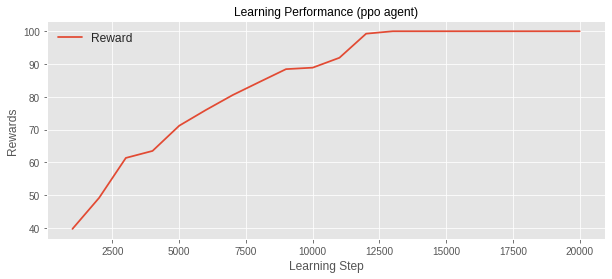

In [10]:
fig, ax = plt.subplots(figsize=(10,4))
plt.style.use('seaborn')
plt.title('Learning Performance (' + str(slicing_agent.agent_algorithm) + ' agent)')
plt.plot(np.arange(1,len(normalized_np_slicing)+1)[0:20]*1000, normalized_np_slicing[0:20], label='Reward', marker="", linestyle="-")#, color='k')
plt.xlabel('Learning Step')
plt.ylabel('Rewards')
plt.legend(prop={'size': 12})